**WARNING**: Remember to run the `ExtractBoundaries` notebook present in this same folder before running all (or specifically the `Import Boundaries` cell)

In [37]:
SAVE_ON_DRIVE = True # Set to True if you want to save the datasets and trained models to your Google Drive
TYPE = 'Train'

# Dataset initialization


### Download Data

In [38]:
from google.colab import drive
import os
import shutil

drive.mount('/content/drive')

# Set paths for Validation and Test datasets
val_dataset_path = '/content/drive/MyDrive/LoveDA/Val'
test_dataset_path = '/content/drive/MyDrive/LoveDA/Test'


# Function to handle dataset download and extraction
def handle_dataset(dataset_name, zip_url, local_path, drive_path):
    if not os.path.exists(local_path):
        if os.path.exists(f"{drive_path}.zip"):
            print(f"{dataset_name} dataset available on own drive, unzipping...")
            !unzip -q {drive_path}.zip -d ./
        else:
            print(f"Downloading {dataset_name} dataset...")
            !wget -O {dataset_name}.zip "{zip_url}"
            if SAVE_ON_DRIVE:
                print(f"Saving {dataset_name} dataset on drive...")
                !cp {dataset_name}.zip {drive_path}.zip
                print(f"{dataset_name} dataset saved on drive")
            print(f"Unzipping {dataset_name} dataset...")
            !unzip -q {dataset_name}.zip -d ./
    else:
        print(f"{dataset_name} dataset already in local")

# Handle Validation dataset
#handle_dataset("Validation", "https://zenodo.org/records/5706578/files/Val.zip?download=1", "./Val", "/content/drive/MyDrive/LoveDA/Val")

# Handle Test dataset
#handle_dataset("Test", "https://zenodo.org/records/5706578/files/Test.zip?download=1", "./Test", "/content/drive/MyDrive/LoveDA/Test")

# Handle Train dataset
handle_dataset("Train", "https://zenodo.org/records/5706578/files/Train.zip?download=1", "./Train", "/content/drive/MyDrive/LoveDA/Train")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train dataset already in local


### Import Boundaries

In [39]:
# Paths
rural_boundaries_path = "./Train/Rural/boundaries_png"
rural_masks_path = './Train/Rural/masks_png'

urban_boundaries_path = "./Train/Urban/boundaries_png"
urban_masks_path = './Train/Urban/masks_png'
drive_rural_boundaries_path = '/content/drive/MyDrive/LoveDA/boundaries/Rural/boundaries_png'
drive_urban_boundaries_path = '/content/drive/MyDrive/LoveDA/boundaries/Urban/boundaries_png'

boundaries_paths = [rural_boundaries_path, urban_boundaries_path]

# Make dir inside ./Train/...
for boundaries_path in boundaries_paths:
    if (os.path.exists(boundaries_path) == False):
        print(f"Creating {boundaries_path}...")
        os.makedirs(boundaries_path)
    else:
        print(f"{boundaries_path} exists...")


# Check if files are already present
rural_file_count = len([name for name in os.listdir(rural_boundaries_path) if os.path.isfile(os.path.join(rural_boundaries_path, name))])
rural_mask_file_count = len([name for name in os.listdir(rural_masks_path) if os.path.isfile(os.path.join(rural_masks_path, name))])
urban_file_count = len([name for name in os.listdir(urban_boundaries_path) if os.path.isfile(os.path.join(urban_boundaries_path, name))])
urban_mask_file_count = len([name for name in os.listdir(urban_masks_path) if os.path.isfile(os.path.join(urban_masks_path, name))])

# if (rural_file_count != rural_mask_file_count):
#     print(f"Importing boundaries, as we have {rural_file_count} rural boundaries as of now...")
#     shutil.copytree(drive_rural_boundaries_path, rural_boundaries_path, dirs_exist_ok=True)
# else:
#     print(f"Rural boundaries already present, {rural_file_count} files...")

if (urban_file_count != urban_mask_file_count):
    print(f"Importing boundaries, as we have {urban_file_count} urban boundaries as of now...")
    shutil.copytree(drive_urban_boundaries_path, urban_boundaries_path, dirs_exist_ok=True)
else:
    print(f"Urban boundaries already present, {urban_file_count} files...")

./Train/Rural/boundaries_png exists...
./Train/Urban/boundaries_png exists...
Urban boundaries already present, 1156 files...


### Dataset Definition

In [40]:
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as T
import random
import cv2


def pil_loader(path, color_type):
    # open path as file to avoid ResourceWarning (https://github.com/python-pillow/Pillow/issues/835)
    with open(path, 'rb') as f:
        img = Image.open(f)
        return img.convert(color_type)

class LoveDADataset(Dataset):
    def __init__(self, baseTransform, augTransforms, split = 'Urban', type = 'Train', useBoundaries=True, validation_ratio=0.2, seed=265637):
        # Validate type input
        if type not in ['Train', 'Validation', 'Total', 'ActualTest']:
            raise ValueError("Invalid type. Expected 'Train' or 'Validation' or 'Total' or 'ActualTest'.")
        self.directory = []
        if type == 'ActualTest':
            directory_path = os.path.join('./Validation', split, 'images_png')
        else:
            directory_path = os.path.join('./Train', split, 'images_png')
        # Check if the directory exists
        if not os.path.exists(directory_path):
            raise FileNotFoundError(f"Directory not found: {directory_path}")
        # Get all image paths
        all_images = [os.path.join(directory_path, entry) for entry in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, entry))]
        # Shuffle images for random splitting
        random.seed(seed)
        random.shuffle(all_images)
        # Split into training and validation sets
        split_idx = int(len(all_images) * (1 - validation_ratio))
        if type == 'Train':
            self.directory = all_images[:split_idx]
        elif type == 'Validation':
            self.directory = all_images[split_idx:]
        elif type == 'Total':
            self.directory = all_images
        elif type == 'ActualTest':
            self.directory = all_images
        else:
            raise ValueError("Invalid type. Expected 'Train' or 'Validation' or 'Total' or 'ActualTest.")
        self.baseTransforms = baseTransform
        self.augTransforms = augTransforms
        self.useBoundaries = useBoundaries
        self.typeDataset = type
        # Print dataset size
        print(f"Dataset size: {len(self.directory)}")

    def __len__(self):
        return len(self.directory)

    def __getitem__(self, idx):
        image_path = self.directory[idx]
        image = pil_loader(image_path, 'RGB')
        mask_path = image_path.replace('images_png', 'masks_png')
        boundaries_path = image_path.replace('images_png', 'boundaries_png')

        mask = pil_loader(mask_path, 'L')

        if self.useBoundaries:
          boundaries = pil_loader(boundaries_path, 'L')
        else:
          boundaries = mask

        base_transformed = self.baseTransforms(image=np.array(image), mask=np.array(mask), boundaries=np.array(boundaries))
        base_image = base_transformed['image']
        base_mask = base_transformed['mask']
        base_boundaries = base_transformed['boundaries']

        base_image = T.Compose([T.ToTensor()])(base_image)
        base_mask = torch.from_numpy(base_mask).long()
        base_mask -= 1
        base_boundaries = torch.from_numpy(base_boundaries)

        if(self.typeDataset != 'Train'):
          return base_image, base_mask, image_path, base_boundaries

        return [base_image], [base_mask], image_path, [base_boundaries]

### Dataset Utils

In [41]:
import matplotlib.patches as mpatches

from collections import OrderedDict
COLOR_MAP = OrderedDict(
    Background=(255, 255, 255),
    Building=(255, 0, 0),
    Road=(255, 255, 0),
    Water=(0, 0, 255),
    Barren=(159, 129, 183),
    Forest=(34, 139, 34),
    Agricultural=(255, 195, 128),
)

LABEL_MAP = OrderedDict(
    Background=0,
    Building=1,
    Road=2,
    Water=3,
    Barren=4,
    Forest=5,
    Agricultural=6,
)
inverted_label_map = OrderedDict((v, k) for k, v in LABEL_MAP.items())


def getLabelColor(label):
    # Default color for unclassified labels
    default_color = np.array([128, 128, 128])  # Gray

    # Check if label exists in inverted_label_map
    label_name = inverted_label_map.get(label, None)
    if label_name is None or label_name not in COLOR_MAP:
        return default_color  # Return default color for unclassified

    # Return the mapped color
    label_color = np.array(COLOR_MAP[label_name])
    return label_color


def getLegendHandles():
  handles = [mpatches.Patch(color=getLabelColor(i)/255, label=inverted_label_map[i]) for i in range(0, len(LABEL_MAP))]
  handles.append(mpatches.Patch(color=getLabelColor(-1)/255, label='Unclassified'))
  return handles

def new_colors_mask(mask):
  new_image = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
  for i, row in enumerate(mask):
    for j, cell in enumerate(row):
      new_image[i][j] = getLabelColor(cell.item())
  return new_image



### Dataset Debug

In [42]:
# # Comment this cell to save GPU time

# import matplotlib.pyplot as plt
# import torch
# from torch.utils.data import DataLoader
# import matplotlib.patches as mpatches

# train_dataset = LoveDADataset(type='Train', seed=222)
# print(train_dataset.__len__())

# # Get item
# image, mask, path, bd = train_dataset.__getitem__(88)

# # Show path
# print(f"Image is at {path}")

# # Show image
# image = image.permute(1, 2, 0)
# image = image.numpy()
# plt.imshow(image)

# # Show mask
# new_image = new_colors_mask(mask)
# plt.imshow(image)
# plt.show()
# plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# plt.imshow(new_image)
# plt.show()

# # Show boundaries
# # for row in bd:
# #     for col in row:
# #         if col != 0 and col != 1:
# #             print(col)
# bd = bd.numpy()
# plt.imshow(bd)


# Initialize model

### STDC Net

In [43]:
import torch
import torch.nn as nn
from torch.nn import init
import math



class ConvX(nn.Module):
    def __init__(self, in_planes, out_planes, kernel=3, stride=1):
        super(ConvX, self).__init__()
        self.conv = nn.Conv2d(in_planes, out_planes, kernel_size=kernel, stride=stride, padding=kernel//2, bias=False)
        self.bn = nn.BatchNorm2d(out_planes)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.relu(self.bn(self.conv(x)))
        return out


class AddBottleneck(nn.Module):
    def __init__(self, in_planes, out_planes, block_num=3, stride=1):
        super(AddBottleneck, self).__init__()
        assert block_num > 1, print("block number should be larger than 1.")
        self.conv_list = nn.ModuleList()
        self.stride = stride
        if stride == 2:
            self.avd_layer = nn.Sequential(
                nn.Conv2d(out_planes//2, out_planes//2, kernel_size=3, stride=2, padding=1, groups=out_planes//2, bias=False),
                nn.BatchNorm2d(out_planes//2),
            )
            self.skip = nn.Sequential(
                nn.Conv2d(in_planes, in_planes, kernel_size=3, stride=2, padding=1, groups=in_planes, bias=False),
                nn.BatchNorm2d(in_planes),
                nn.Conv2d(in_planes, out_planes, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_planes),
            )
            stride = 1

        for idx in range(block_num):
            if idx == 0:
                self.conv_list.append(ConvX(in_planes, out_planes//2, kernel=1))
            elif idx == 1 and block_num == 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//2, stride=stride))
            elif idx == 1 and block_num > 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//4, stride=stride))
            elif idx < block_num - 1:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx+1))))
            else:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx))))

    def forward(self, x):
        out_list = []
        out = x

        for idx, conv in enumerate(self.conv_list):
            if idx == 0 and self.stride == 2:
                out = self.avd_layer(conv(out))
            else:
                out = conv(out)
            out_list.append(out)

        if self.stride == 2:
            x = self.skip(x)

        return torch.cat(out_list, dim=1) + x



class CatBottleneck(nn.Module):
    def __init__(self, in_planes, out_planes, block_num=3, stride=1):
        super(CatBottleneck, self).__init__()
        assert block_num > 1, print("block number should be larger than 1.")
        self.conv_list = nn.ModuleList()
        self.stride = stride
        if stride == 2:
            self.avd_layer = nn.Sequential(
                nn.Conv2d(out_planes//2, out_planes//2, kernel_size=3, stride=2, padding=1, groups=out_planes//2, bias=False),
                nn.BatchNorm2d(out_planes//2),
            )
            self.skip = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
            stride = 1

        for idx in range(block_num):
            if idx == 0:
                self.conv_list.append(ConvX(in_planes, out_planes//2, kernel=1))
            elif idx == 1 and block_num == 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//2, stride=stride))
            elif idx == 1 and block_num > 2:
                self.conv_list.append(ConvX(out_planes//2, out_planes//4, stride=stride))
            elif idx < block_num - 1:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx+1))))
            else:
                self.conv_list.append(ConvX(out_planes//int(math.pow(2, idx)), out_planes//int(math.pow(2, idx))))

    def forward(self, x):
        out_list = []
        out1 = self.conv_list[0](x)

        for idx, conv in enumerate(self.conv_list[1:]):
            if idx == 0:
                if self.stride == 2:
                    out = conv(self.avd_layer(out1))
                else:
                    out = conv(out1)
            else:
                out = conv(out)
            out_list.append(out)

        if self.stride == 2:
            out1 = self.skip(out1)
        out_list.insert(0, out1)

        out = torch.cat(out_list, dim=1)
        return out

#STDC2Net
class STDCNet1446(nn.Module):
    def __init__(self, base=64, layers=[4,5,3], block_num=4, type="cat", num_classes=1000, dropout=0.20, pretrain_model='', use_conv_last=False):
        super(STDCNet1446, self).__init__()
        if type == "cat":
            block = CatBottleneck
        elif type == "add":
            block = AddBottleneck
        self.use_conv_last = use_conv_last
        self.features = self._make_layers(base, layers, block_num, block)
        self.conv_last = ConvX(base*16, max(1024, base*16), 1, 1)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(max(1024, base*16), max(1024, base*16), bias=False)
        self.bn = nn.BatchNorm1d(max(1024, base*16))
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(p=dropout)
        self.linear = nn.Linear(max(1024, base*16), num_classes, bias=False)

        self.x2 = nn.Sequential(self.features[:1])
        self.x4 = nn.Sequential(self.features[1:2])
        self.x8 = nn.Sequential(self.features[2:6])
        self.x16 = nn.Sequential(self.features[6:11])
        self.x32 = nn.Sequential(self.features[11:])

        if pretrain_model:
            print('use pretrain model {}'.format(pretrain_model))
            self.init_weight(pretrain_model)
        else:
            self.init_params()

    def init_weight(self, pretrain_model):

        state_dict = torch.load(pretrain_model)["state_dict"]
        self_state_dict = self.state_dict()
        for k, v in state_dict.items():
            self_state_dict.update({k: v})
        self.load_state_dict(self_state_dict)

    def init_params(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, std=0.001)
                if m.bias is not None:
                    init.constant_(m.bias, 0)

    def _make_layers(self, base, layers, block_num, block):
        features = []
        features += [ConvX(3, base//2, 3, 2)]
        features += [ConvX(base//2, base, 3, 2)]

        for i, layer in enumerate(layers):
            for j in range(layer):
                if i == 0 and j == 0:
                    features.append(block(base, base*4, block_num, 2))
                elif j == 0:
                    features.append(block(base*int(math.pow(2,i+1)), base*int(math.pow(2,i+2)), block_num, 2))
                else:
                    features.append(block(base*int(math.pow(2,i+2)), base*int(math.pow(2,i+2)), block_num, 1))

        return nn.Sequential(*features)

    def forward(self, x):
        feat2 = self.x2(x)
        feat4 = self.x4(feat2)
        feat8 = self.x8(feat4)
        feat16 = self.x16(feat8)
        feat32 = self.x32(feat16)
        if self.use_conv_last:
           feat32 = self.conv_last(feat32)

        return feat2, feat4, feat8, feat16, feat32

    def forward_impl(self, x):
        out = self.features(x)
        out = self.conv_last(out).pow(2)
        out = self.gap(out).flatten(1)
        out = self.fc(out)
        # out = self.bn(out)
        out = self.relu(out)
        # out = self.relu(self.bn(self.fc(out)))
        out = self.dropout(out)
        out = self.linear(out)
        return out

# STDC1Net
class STDCNet813(nn.Module):
    def __init__(self, base=64, layers=[2,2,2], block_num=4, type="cat", num_classes=1000, dropout=0.20, pretrain_model='', use_conv_last=False):
        super(STDCNet813, self).__init__()
        if type == "cat":
            block = CatBottleneck
        elif type == "add":
            block = AddBottleneck
        self.use_conv_last = use_conv_last
        self.features = self._make_layers(base, layers, block_num, block)
        self.conv_last = ConvX(base*16, max(1024, base*16), 1, 1)
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(max(1024, base*16), max(1024, base*16), bias=False)
        self.bn = nn.BatchNorm1d(max(1024, base*16))
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(p=dropout)
        self.linear = nn.Linear(max(1024, base*16), num_classes, bias=False)

        self.x2 = nn.Sequential(self.features[:1])
        self.x4 = nn.Sequential(self.features[1:2])
        self.x8 = nn.Sequential(self.features[2:4])
        self.x16 = nn.Sequential(self.features[4:6])
        self.x32 = nn.Sequential(self.features[6:])

        if pretrain_model:
            print('use pretrain model {}'.format(pretrain_model))
            self.init_weight(pretrain_model)
        else:
            self.init_params()

    def init_weight(self, pretrain_model):

        state_dict = torch.load(pretrain_model)["state_dict"]
        self_state_dict = self.state_dict()
        for k, v in state_dict.items():
            self_state_dict.update({k: v})
        self.load_state_dict(self_state_dict)

    def init_params(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, std=0.001)
                if m.bias is not None:
                    init.constant_(m.bias, 0)

    def _make_layers(self, base, layers, block_num, block):
        features = []
        features += [ConvX(3, base//2, 3, 2)]
        features += [ConvX(base//2, base, 3, 2)]

        for i, layer in enumerate(layers):
            for j in range(layer):
                if i == 0 and j == 0:
                    features.append(block(base, base*4, block_num, 2))
                elif j == 0:
                    features.append(block(base*int(math.pow(2,i+1)), base*int(math.pow(2,i+2)), block_num, 2))
                else:
                    features.append(block(base*int(math.pow(2,i+2)), base*int(math.pow(2,i+2)), block_num, 1))

        return nn.Sequential(*features)

    def forward(self, x):
        feat2 = self.x2(x)
        feat4 = self.x4(feat2)
        feat8 = self.x8(feat4)
        feat16 = self.x16(feat8)
        feat32 = self.x32(feat16)
        if self.use_conv_last:
           feat32 = self.conv_last(feat32)

        return feat2, feat4, feat8, feat16, feat32

    def forward_impl(self, x):
        out = self.features(x)
        out = self.conv_last(out).pow(2)
        out = self.gap(out).flatten(1)
        out = self.fc(out)
        # out = self.bn(out)
        out = self.relu(out)
        # out = self.relu(self.bn(self.fc(out)))
        out = self.dropout(out)
        out = self.linear(out)
        return out

### STDC Definition

In [44]:
#!/usr/bin/python
# -*- encoding: utf-8 -*-


import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

BatchNorm2d = nn.BatchNorm2d

class ConvBNReLU(nn.Module):
    def __init__(self, in_chan, out_chan, ks=3, stride=1, padding=1, *args, **kwargs):
        super(ConvBNReLU, self).__init__()
        self.conv = nn.Conv2d(in_chan,
                out_chan,
                kernel_size = ks,
                stride = stride,
                padding = padding,
                bias = False)
        self.bn = BatchNorm2d(out_chan)
        #self.bn = BatchNorm2d(out_chan, activation='none')
        self.relu = nn.ReLU()
        self.init_weight()

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)


class BiSeNetOutput(nn.Module):
    def __init__(self, in_chan, mid_chan, n_classes, *args, **kwargs):
        super(BiSeNetOutput, self).__init__()
        self.conv = ConvBNReLU(in_chan, mid_chan, ks=3, stride=1, padding=1)
        self.conv_out = nn.Conv2d(mid_chan, n_classes, kernel_size=1, bias=False)
        self.init_weight()

    def forward(self, x):
        x = self.conv(x)
        x = self.conv_out(x)
        return x

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class AttentionRefinementModule(nn.Module):
    def __init__(self, in_chan, out_chan, *args, **kwargs):
        super(AttentionRefinementModule, self).__init__()
        self.conv = ConvBNReLU(in_chan, out_chan, ks=3, stride=1, padding=1)
        self.conv_atten = nn.Conv2d(out_chan, out_chan, kernel_size= 1, bias=False)
        self.bn_atten = BatchNorm2d(out_chan)
        #self.bn_atten = BatchNorm2d(out_chan, activation='none')

        self.sigmoid_atten = nn.Sigmoid()
        self.init_weight()

    def forward(self, x):
        feat = self.conv(x)
        atten = F.avg_pool2d(feat, feat.size()[2:])
        atten = self.conv_atten(atten)
        atten = self.bn_atten(atten)
        atten = self.sigmoid_atten(atten)
        out = torch.mul(feat, atten)
        return out

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)


class ContextPath(nn.Module):
    def __init__(self, backbone='CatNetSmall', pretrain_model='', use_conv_last=False, *args, **kwargs):
        super(ContextPath, self).__init__()

        self.backbone_name = backbone
        if backbone == 'STDCNet1446':
            self.backbone = STDCNet1446(pretrain_model=pretrain_model, use_conv_last=use_conv_last)
            self.arm16 = AttentionRefinementModule(512, 128)
            inplanes = 1024
            if use_conv_last:
                inplanes = 1024
            self.arm32 = AttentionRefinementModule(inplanes, 128)
            self.conv_head32 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_head16 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_avg = ConvBNReLU(inplanes, 128, ks=1, stride=1, padding=0)

        elif backbone == 'STDCNet813':
            self.backbone = STDCNet813(pretrain_model=pretrain_model, use_conv_last=use_conv_last)
            self.arm16 = AttentionRefinementModule(512, 128)
            inplanes = 1024
            if use_conv_last:
                inplanes = 1024
            self.arm32 = AttentionRefinementModule(inplanes, 128)
            self.conv_head32 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_head16 = ConvBNReLU(128, 128, ks=3, stride=1, padding=1)
            self.conv_avg = ConvBNReLU(inplanes, 128, ks=1, stride=1, padding=0)
        else:
            print("backbone is not in backbone lists")
            exit(0)

        self.init_weight()

    def forward(self, x):
        H0, W0 = x.size()[2:]

        feat2, feat4, feat8, feat16, feat32 = self.backbone(x)
        H8, W8 = feat8.size()[2:]
        H16, W16 = feat16.size()[2:]
        H32, W32 = feat32.size()[2:]

        avg = F.avg_pool2d(feat32, feat32.size()[2:])

        avg = self.conv_avg(avg)
        avg_up = F.interpolate(avg, (H32, W32), mode='nearest')

        feat32_arm = self.arm32(feat32)
        feat32_sum = feat32_arm + avg_up
        feat32_up = F.interpolate(feat32_sum, (H16, W16), mode='nearest')
        feat32_up = self.conv_head32(feat32_up)

        feat16_arm = self.arm16(feat16)
        feat16_sum = feat16_arm + feat32_up
        feat16_up = F.interpolate(feat16_sum, (H8, W8), mode='nearest')
        feat16_up = self.conv_head16(feat16_up)

        return feat2, feat4, feat8, feat16, feat16_up, feat32_up # x8, x16

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class FeatureFusionModule(nn.Module):
    def __init__(self, in_chan, out_chan, *args, **kwargs):
        super(FeatureFusionModule, self).__init__()
        self.convblk = ConvBNReLU(in_chan, out_chan, ks=1, stride=1, padding=0)
        self.conv1 = nn.Conv2d(out_chan,
                out_chan//4,
                kernel_size = 1,
                stride = 1,
                padding = 0,
                bias = False)
        self.conv2 = nn.Conv2d(out_chan//4,
                out_chan,
                kernel_size = 1,
                stride = 1,
                padding = 0,
                bias = False)
        self.relu = nn.ReLU(inplace=True)
        self.sigmoid = nn.Sigmoid()
        self.init_weight()

    def forward(self, fsp, fcp):
        fcat = torch.cat([fsp, fcp], dim=1)
        feat = self.convblk(fcat)
        atten = F.avg_pool2d(feat, feat.size()[2:])
        atten = self.conv1(atten)
        atten = self.relu(atten)
        atten = self.conv2(atten)
        atten = self.sigmoid(atten)
        feat_atten = torch.mul(feat, atten)
        feat_out = feat_atten + feat
        return feat_out

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params = [], []
        for name, module in self.named_modules():
            if isinstance(module, (nn.Linear, nn.Conv2d)):
                wd_params.append(module.weight)
                if not module.bias is None:
                    nowd_params.append(module.bias)
            elif isinstance(module, BatchNorm2d):
                nowd_params += list(module.parameters())
        return wd_params, nowd_params


class BiSeNet(nn.Module):
    def __init__(self, backbone, n_classes, pretrain_model='', use_boundary_2=False, use_boundary_4=False, use_boundary_8=False, use_boundary_16=False, use_conv_last=False, heat_map=False, *args, **kwargs):
        super(BiSeNet, self).__init__()

        self.use_boundary_2 = use_boundary_2
        self.use_boundary_4 = use_boundary_4
        self.use_boundary_8 = use_boundary_8
        self.use_boundary_16 = use_boundary_16
        # self.heat_map = heat_map
        self.cp = ContextPath(backbone, pretrain_model, use_conv_last=use_conv_last)



        if backbone == 'STDCNet1446':
            conv_out_inplanes = 128
            sp2_inplanes = 32
            sp4_inplanes = 64
            sp8_inplanes = 256
            sp16_inplanes = 512
            inplane = sp8_inplanes + conv_out_inplanes

        elif backbone == 'STDCNet813':
            conv_out_inplanes = 128
            sp2_inplanes = 32
            sp4_inplanes = 64
            sp8_inplanes = 256
            sp16_inplanes = 512
            inplane = sp8_inplanes + conv_out_inplanes

        else:
            print("backbone is not in backbone lists")
            exit(0)

        self.ffm = FeatureFusionModule(inplane, 256)
        self.conv_out = BiSeNetOutput(256, 256, n_classes)
        self.conv_out16 = BiSeNetOutput(conv_out_inplanes, 64, n_classes)
        self.conv_out32 = BiSeNetOutput(conv_out_inplanes, 64, n_classes)

        self.conv_out_sp16 = BiSeNetOutput(sp16_inplanes, 64, 1)

        self.conv_out_sp8 = BiSeNetOutput(sp8_inplanes, 64, 1)
        self.conv_out_sp4 = BiSeNetOutput(sp4_inplanes, 64, 1)
        self.conv_out_sp2 = BiSeNetOutput(sp2_inplanes, 64, 1)
        self.init_weight()

    def forward(self, x):
        H, W = x.size()[2:]

        feat_res2, feat_res4, feat_res8, feat_res16, feat_cp8, feat_cp16 = self.cp(x)

        feat_out_sp2 = self.conv_out_sp2(feat_res2)

        feat_out_sp4 = self.conv_out_sp4(feat_res4)

        feat_out_sp8 = self.conv_out_sp8(feat_res8)

        feat_out_sp16 = self.conv_out_sp16(feat_res16)

        feat_fuse = self.ffm(feat_res8, feat_cp8)

        feat_out = self.conv_out(feat_fuse)
        feat_out16 = self.conv_out16(feat_cp8)
        feat_out32 = self.conv_out32(feat_cp16)

        feat_out = F.interpolate(feat_out, (H, W), mode='bilinear', align_corners=True)
        feat_out16 = F.interpolate(feat_out16, (H, W), mode='bilinear', align_corners=True)
        feat_out32 = F.interpolate(feat_out32, (H, W), mode='bilinear', align_corners=True)


        if self.use_boundary_2 and self.use_boundary_4 and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp2, feat_out_sp4, feat_out_sp8

        if (not self.use_boundary_2) and self.use_boundary_4 and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp4, feat_out_sp8

        if (not self.use_boundary_2) and (not self.use_boundary_4) and self.use_boundary_8:
            return feat_out, feat_out16, feat_out32, feat_out_sp8

        if (not self.use_boundary_2) and (not self.use_boundary_4) and (not self.use_boundary_8):
            return feat_out, feat_out16, feat_out32

    def init_weight(self):
        for ly in self.children():
            if isinstance(ly, nn.Conv2d):
                nn.init.kaiming_normal_(ly.weight, a=1)
                if not ly.bias is None: nn.init.constant_(ly.bias, 0)

    def get_params(self):
        wd_params, nowd_params, lr_mul_wd_params, lr_mul_nowd_params = [], [], [], []
        for name, child in self.named_children():
            child_wd_params, child_nowd_params = child.get_params()
            if isinstance(child, (FeatureFusionModule, BiSeNetOutput)):
                lr_mul_wd_params += child_wd_params
                lr_mul_nowd_params += child_nowd_params
            else:
                wd_params += child_wd_params
                nowd_params += child_nowd_params
        return wd_params, nowd_params, lr_mul_wd_params, lr_mul_nowd_params



### Discriminator Model

In [45]:
# Remember to upsample the input x before running it through this, as the paper says
import torch
import torch.nn as nn
import torch.nn.init as init


class Discriminator(nn.Module):
    def __init__(self, num_classes):
        super(Discriminator, self).__init__()
        self.domain_classifier = nn.Sequential(
            nn.Conv2d(num_classes, 64, kernel_size=4, stride=2, padding=1),  # Conv1
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # Conv2
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # Conv3
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # Conv4
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=2, padding=1),  # Conv5
        )

    def forward(self, x):
        return self.domain_classifier(x)

# Initialize the model with Kaiming initialization
def initialize_weights_kaiming(m):
    if isinstance(m, nn.Conv2d):
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='leaky_relu')
        if m.bias is not None:
            init.zeros_(m.bias)

### Load STDC Model

In [46]:
import gdown
import tarfile
import os

if (os.path.exists("./model_maxmIOU75.pth") == False):
  url = "https://drive.google.com/uc?id=17nPaTe9mCQ9OEb0VFz32eJVfWzvEPKGW"
  output = "./"
  gdown.download(url, output, quiet=False)
# Then keep as tar, as it's already the correct format to feed the model
pretrain_path = ''

model = BiSeNet(backbone='STDCNet1446', n_classes=len(LABEL_MAP), pretrain_model=pretrain_path,
    use_boundary_2=True, use_boundary_4=True, use_boundary_8=True,
    use_boundary_16=False, use_conv_last=False)

# Load the checkpoint with map_location to ensure it loads on CPU
checkpoint = torch.load('./model_maxmIOU75.pth', map_location=torch.device('cpu'))
model_state_dict = model.state_dict()

# Filter out unnecessary keys
pretrained_dict = {k: v for k, v in checkpoint.items() if k in model_state_dict and model_state_dict[k].shape == v.shape}

# Overwrite entries in the existing state dict
model_state_dict.update(pretrained_dict)

# Load the new state dict
model.load_state_dict(model_state_dict)

print("Model loaded")

disc_model = Discriminator(len(LABEL_MAP))
disc_model.apply(initialize_weights_kaiming)

print("Discriminator model loaded")

Model loaded
Discriminator model loaded


<ipython-input-46-b97fbd4058a8>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('./model_maxmIOU75.pth', map_location=torch.device('cpu'))


# Training & Dataset creation

### Hyperparams, Ablations, Macros

In [47]:
################################################################################
# Macros
DEVICE = 'cuda' # 'cuda' or 'cpu'
LOG_FREQUENCY = 5
NUM_CLASSES = len(LABEL_MAP)

################################################################################
# Hyperparams To Ablate

LR = 1e-4        # The initial Learning Rate -- I increased it using quadratic rule in relation with batch size
DISC_LR = 5e-4  #1e-4   # The initial Learning Rate for Discriminator
MOMENTUM = 0.9       # Hyperparameter for SGD, keep this at 0.9 when using SGD
WEIGHT_DECAY = 5e-5  # Regularization, you can keep this at the default

NUM_EPOCHS = 20      # Total number of training epochs (iterations over dataset)
STEP_SIZE = 21     # How many epochs before decreasing learning rate (if using a step-down policy) -- Trying to keep a 2:3 ratio with NUM_EPOCHS
DISC_STEP_SIZE = 21
# STEP_SIZEs = [21, 14]
# DISC_STEP_SIZEs = [14, 21]
GAMMA = 0.1          # Multiplicative factor for learning rate step-down

BATCH_SIZE = 24

LAMBDA_SEG = 1
LAMBDA_ADVs = [1e-4]
LAMBDA_DISC = 0.1

FREEZE_PIDNET_COMPLETELY_WHEN_TRAINING_DISCRIMINATOR = False

#VALIDATE_ON_WHAT = 'PID+ADV+DISC' # 'PID+ADV+DISC' or 'PID+RuralGT'

LOAD_BASE_MODEL = True
drive_path = '/content/drive/MyDrive/LoveDA/'
model_name = 'best_model_STDC_Jitter+RotateFlip+Resize.pth.pth'
################################################################################
# Other Macros

SAVE_AFTER_EPOCH = 19 # Keep this between 15 and 18 maybe, since the "best" model (the one with minimal overall loss) is often not the best in mIoU
TEST_ONLY_ON_BEST = False # Leave False unless you're really picky/in need of time
TEST_MODELS_FROM_MYDRIVE_TOO = False
INTEREST = "False"

### Augmentations/Transforms

In [48]:
from albumentations import Compose, HorizontalFlip, RandomRotate90, RandomScale, RandomCrop, GaussNoise, Rotate, Resize, OneOf, Normalize, ColorJitter, GaussianBlur
from albumentations.pytorch import ToTensorV2

#How big should be the image that we feed to the model?
RESIZE = 512
# DEFINE TRANSFORMATIONS HERE
# To Tensor is not needed since its performed inside the getitem


AUGMENTATIONS = {
    'Resize': Compose([
            Resize(RESIZE, RESIZE),
    ], additional_targets={"boundaries": "mask"}),
    'Jitter+RotateFlip+Resize': Compose([
        ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
        OneOf([
            HorizontalFlip(p=0.5),
            RandomRotate90(p=0.5),
        ], p=0.5),
        Resize(RESIZE, RESIZE),
        ], additional_targets={"boundaries": "mask"}),

}

CHOOSE_TRANSFORM = 'Resize' # The dictionary key for the base transform
AUGTRANSFORM = None         # The transform object itself for the extra transform

### Setup, Create Datasets and DataLoaders. With annexed transforms.

In [49]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F

## Dataset and Loader
# Training Sets and Loaders
source_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[CHOOSE_TRANSFORM], augTransforms=AUGTRANSFORM, split='Urban', type='Train', validation_ratio=0.2)
source_loader = DataLoader(source_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True, pin_memory=True)

target_dataset = LoveDADataset(baseTransform=AUGMENTATIONS[CHOOSE_TRANSFORM], augTransforms=AUGTRANSFORM, split='Rural', type='Train', validation_ratio=0.2, useBoundaries=False)
target_loader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True, pin_memory=True)

# Validation Sets and Loaders
source_validation_dataset = LoveDADataset(baseTransform=AUGMENTATIONS['Resize'], augTransforms=None, split='Urban', type='Validation', validation_ratio=0.2, useBoundaries=False)
source_validation_loader = DataLoader(source_validation_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

target_validation_dataset = LoveDADataset(baseTransform=AUGMENTATIONS['Resize'], augTransforms=None, split='Rural', type='Validation', validation_ratio=0.2, useBoundaries=False)
target_validation_loader = DataLoader(target_validation_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

## Model is defined some cells above, in LoadPidNetModel
# Now load its weights
if LOAD_BASE_MODEL:
  model_path = os.path.join(drive_path, model_name)
  print(f"LOADING {model_path}")
  best_model = torch.load(model_path, map_location=DEVICE)
  model.load_state_dict(best_model)

## Optimizier and Scheduler
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=LR, momentum=MOMENTUM)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

disc_optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=DISC_LR, betas=(0.9, 0.99))
disc_scheduler = optim.lr_scheduler.StepLR(disc_optimizer, step_size=DISC_STEP_SIZE, gamma=GAMMA)

<ipython-input-49-439b882fa156>:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model = torch.load(model_path, map_location=DEVICE)


Dataset size: 924
Dataset size: 1092
Dataset size: 232
Dataset size: 274
LOADING /content/drive/MyDrive/LoveDA/best_model_STDC_Jitter+RotateFlip+Resize.pth.pth


### Losses

In [50]:
# TODO EXTRA add weights=class_weights to nn.CrossEntropyLoss()
# TODO EXTRA use OHCE instead of basic one
def cross_entropy(score, target):
    compute_ce_loss = nn.CrossEntropyLoss(ignore_index=-1)

    # See paper for weights. In order of loss index: (0.4, 20, 1, 1) # But on cfg they set everything to 0.5
    balance_weights = [0.4, 1]
    sb_weights = 1

    # print(f"DEBUG: inside cross_entropy: len(score) = {len(score)}")
    if len(balance_weights) == len(score):
        return sum([w * compute_ce_loss(x, target) for (w, x) in zip(balance_weights, score)])
    elif len(score) == 1:
        return sb_weights * compute_ce_loss(score[0], target)
    else:
        raise ValueError("lengths of prediction and target are not identical!")

# Dice Loss (used for boundary regions)
def dice_loss(pred, target):
    smooth = 1e-6
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    return 1 - (2. * intersection + smooth) / (union + smooth)

class DetailAggregateLoss(nn.Module):
    def __init__(self, *args, **kwargs):
        super(DetailAggregateLoss, self).__init__()

        self.laplacian_kernel = torch.tensor(
            [-1, -1, -1, -1, 8, -1, -1, -1, -1],
            dtype=torch.float32).reshape(1, 1, 3, 3).requires_grad_(False).type(torch.cuda.FloatTensor)

        self.fuse_kernel = torch.nn.Parameter(torch.tensor([[6./10], [3./10], [1./10]],
            dtype=torch.float32).reshape(1, 3, 1, 1).type(torch.cuda.FloatTensor))

    def forward(self, boundary_logits, gtmasks):

        # boundary_logits = boundary_logits.unsqueeze(1)
        boundary_targets = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, padding=1)
        boundary_targets = boundary_targets.clamp(min=0)
        boundary_targets[boundary_targets > 0.1] = 1
        boundary_targets[boundary_targets <= 0.1] = 0

        boundary_targets_x2 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=2, padding=1)
        boundary_targets_x2 = boundary_targets_x2.clamp(min=0)

        boundary_targets_x4 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=4, padding=1)
        boundary_targets_x4 = boundary_targets_x4.clamp(min=0)

        boundary_targets_x8 = F.conv2d(gtmasks.unsqueeze(1).type(torch.cuda.FloatTensor), self.laplacian_kernel, stride=8, padding=1)
        boundary_targets_x8 = boundary_targets_x8.clamp(min=0)

        boundary_targets_x8_up = F.interpolate(boundary_targets_x8, boundary_targets.shape[2:], mode='nearest')
        boundary_targets_x4_up = F.interpolate(boundary_targets_x4, boundary_targets.shape[2:], mode='nearest')
        boundary_targets_x2_up = F.interpolate(boundary_targets_x2, boundary_targets.shape[2:], mode='nearest')

        boundary_targets_x2_up[boundary_targets_x2_up > 0.1] = 1
        boundary_targets_x2_up[boundary_targets_x2_up <= 0.1] = 0


        boundary_targets_x4_up[boundary_targets_x4_up > 0.1] = 1
        boundary_targets_x4_up[boundary_targets_x4_up <= 0.1] = 0


        boundary_targets_x8_up[boundary_targets_x8_up > 0.1] = 1
        boundary_targets_x8_up[boundary_targets_x8_up <= 0.1] = 0

        boudary_targets_pyramids = torch.stack((boundary_targets, boundary_targets_x2_up, boundary_targets_x4_up), dim=1)

        boudary_targets_pyramids = boudary_targets_pyramids.squeeze(2)
        boudary_targets_pyramid = F.conv2d(boudary_targets_pyramids, self.fuse_kernel)

        boudary_targets_pyramid[boudary_targets_pyramid > 0.1] = 1
        boudary_targets_pyramid[boudary_targets_pyramid <= 0.1] = 0


        if boundary_logits.shape[-1] != boundary_targets.shape[-1]:
            boundary_logits = F.interpolate(
                boundary_logits, boundary_targets.shape[2:], mode='bilinear', align_corners=True)

        bce_loss = F.binary_cross_entropy_with_logits(boundary_logits, boudary_targets_pyramid)
        dice_loss_value = dice_loss(torch.sigmoid(boundary_logits), boudary_targets_pyramid)
        return bce_loss,  dice_loss_value

sem_loss = cross_entropy
bce_loss = torch.nn.BCEWithLogitsLoss()

### Training Loop

DEVICE is cuda. Loss scales are: LAMBDA_SEG=1, LAMBDA_ADV=0.0001, LAMBDA_DISC=0.1


9it [00:07,  1.21it/s]

mIoU on source before training: 0.29068559408187866
Starting epoch 1/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping



  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.2900 --- loss_adv at batch 0: 6.4100 --- 

  3%|▎         | 1/38 [00:02<01:17,  2.10s/it]

loss_disc at batch 0: 9.6278


 13%|█▎        | 5/38 [00:05<00:29,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.2233 --- loss_adv at batch 5: 6.1098 --- 

 16%|█▌        | 6/38 [00:05<00:24,  1.33it/s]

loss_disc at batch 5: 9.5424


 26%|██▋       | 10/38 [00:09<00:25,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.1513 --- loss_adv at batch 10: 8.5383 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.10it/s]

loss_disc at batch 10: 9.1942


 39%|███▉      | 15/38 [00:12<00:15,  1.51it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.4595 --- loss_adv at batch 15: 6.6455 --- 

 42%|████▏     | 16/38 [00:13<00:13,  1.65it/s]

loss_disc at batch 15: 10.2002


 53%|█████▎    | 20/38 [00:16<00:16,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.1211 --- loss_adv at batch 20: 8.6243 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.12it/s]

loss_disc at batch 20: 9.0519


 66%|██████▌   | 25/38 [00:20<00:08,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.6093 --- loss_adv at batch 25: 6.6807 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.73it/s]

loss_disc at batch 25: 11.0103


 79%|███████▉  | 30/38 [00:23<00:05,  1.59it/s]


[losses are unscaled] loss_pidnet at batch 30: 5.9960 --- loss_adv at batch 30: 8.4365 --- 

 82%|████████▏ | 31/38 [00:24<00:06,  1.11it/s]

loss_disc at batch 30: 8.9427


 92%|█████████▏| 35/38 [00:28<00:02,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.1168 --- loss_adv at batch 35: 8.5750 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.37it/s]

loss_disc at batch 35: 8.9541


100%|██████████| 38/38 [00:29<00:00,  1.28it/s]
9it [00:07,  1.27it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.24944977462291718
[EPOCH 01] Avg. Losses:
loss_complete        0.304521
loss_pidnet          0.263632
loss_adv             0.317750
loss_disc            0.408568
loss_pidnet_wtd      0.263632
loss_adv_wtd         0.000032
loss_disc_wtd        0.040857
Validation
mIoU on Urban: 0.24944977462291718


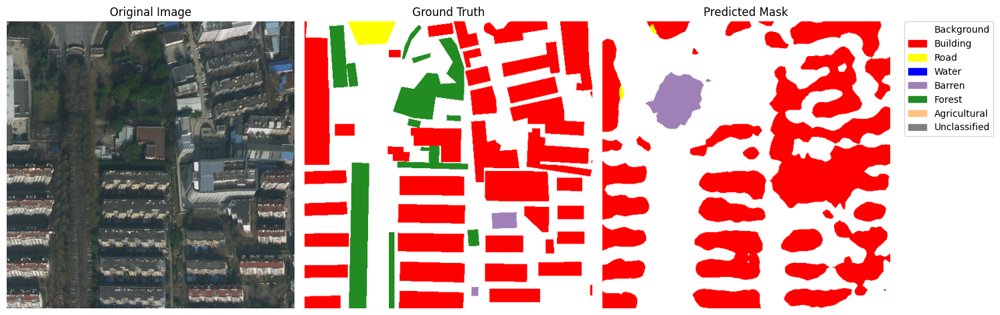

Starting epoch 2/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.7380 --- loss_adv at batch 0: 6.4114 --- 

  3%|▎         | 1/38 [00:02<01:15,  2.03s/it]

loss_disc at batch 0: 11.2260


 13%|█▎        | 5/38 [00:05<00:36,  1.09s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.3312 --- loss_adv at batch 5: 8.5906 --- 

 16%|█▌        | 6/38 [00:06<00:32,  1.02s/it]

loss_disc at batch 5: 9.2375


 26%|██▋       | 10/38 [00:09<00:21,  1.31it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.6117 --- loss_adv at batch 10: 7.1183 --- 

 29%|██▉       | 11/38 [00:09<00:17,  1.57it/s]

loss_disc at batch 10: 11.7462


 39%|███▉      | 15/38 [00:12<00:15,  1.45it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.4494 --- loss_adv at batch 15: 7.0310 --- 

 42%|████▏     | 16/38 [00:12<00:13,  1.60it/s]

loss_disc at batch 15: 12.1468


 53%|█████▎    | 20/38 [00:17<00:15,  1.14it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.2161 --- loss_adv at batch 20: 8.7076 --- 

 55%|█████▌    | 21/38 [00:17<00:14,  1.14it/s]

loss_disc at batch 20: 9.1088


 66%|██████▌   | 25/38 [00:19<00:07,  1.70it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.3930 --- loss_adv at batch 25: 7.3627 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.80it/s]

loss_disc at batch 25: 10.3596


 79%|███████▉  | 30/38 [00:24<00:07,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.0834 --- loss_adv at batch 30: 8.7170 --- 

 82%|████████▏ | 31/38 [00:24<00:06,  1.12it/s]

loss_disc at batch 30: 9.1089


 92%|█████████▏| 35/38 [00:27<00:01,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4409 --- loss_adv at batch 35: 6.8378 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.73it/s]

loss_disc at batch 35: 10.7637


100%|██████████| 38/38 [00:29<00:00,  1.29it/s]
9it [00:07,  1.29it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.25080689787864685
[EPOCH 02] Avg. Losses:
loss_complete        0.307719
loss_pidnet          0.265532
loss_adv             0.322377
loss_disc            0.421554
loss_pidnet_wtd      0.265532
loss_adv_wtd         0.000032
loss_disc_wtd        0.042155
Validation
mIoU on Urban: 0.25080689787864685


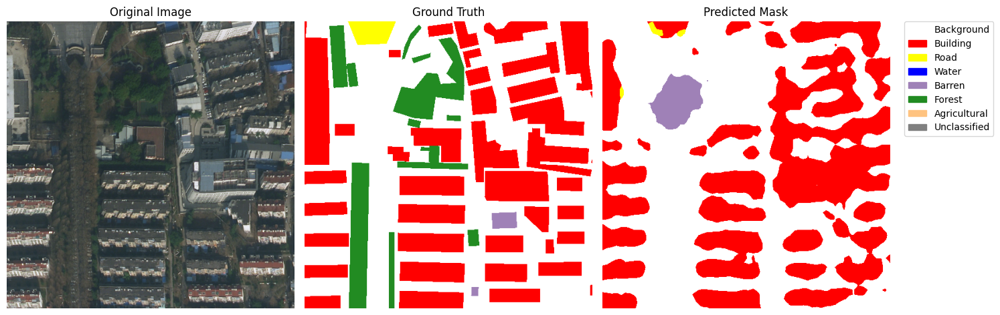

Starting epoch 3/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.6315 --- loss_adv at batch 0: 6.5653 --- 

  3%|▎         | 1/38 [00:02<01:16,  2.06s/it]

loss_disc at batch 0: 11.0497


 13%|█▎        | 5/38 [00:05<00:33,  1.03s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.3169 --- loss_adv at batch 5: 8.5772 --- 

 16%|█▌        | 6/38 [00:06<00:31,  1.03it/s]

loss_disc at batch 5: 9.2153


 26%|██▋       | 10/38 [00:08<00:16,  1.72it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.4162 --- loss_adv at batch 10: 7.7528 --- 

 29%|██▉       | 11/38 [00:09<00:16,  1.61it/s]

loss_disc at batch 10: 11.1622


 39%|███▉      | 15/38 [00:12<00:21,  1.08it/s]


[losses are unscaled] loss_pidnet at batch 15: 5.9890 --- loss_adv at batch 15: 8.7572 --- 

 42%|████▏     | 16/38 [00:13<00:20,  1.10it/s]

loss_disc at batch 15: 8.8912


 53%|█████▎    | 20/38 [00:16<00:13,  1.37it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.6329 --- 

 55%|█████▌    | 21/38 [00:17<00:12,  1.34it/s]

loss_adv at batch 20: 6.8477 --- loss_disc at batch 20: 9.9771


 66%|██████▌   | 25/38 [00:19<00:08,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.1326 --- loss_adv at batch 25: 6.8118 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.74it/s]

loss_disc at batch 25: 9.9570


 79%|███████▉  | 30/38 [00:24<00:06,  1.15it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.1501 --- loss_adv at batch 30: 8.6455 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.14it/s]

loss_disc at batch 30: 9.1219


 92%|█████████▏| 35/38 [00:27<00:02,  1.48it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.3150 --- loss_adv at batch 35: 6.2803 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.63it/s]

loss_disc at batch 35: 10.6418


100%|██████████| 38/38 [00:29<00:00,  1.29it/s]
9it [00:07,  1.28it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.251197874546051
[EPOCH 03] Avg. Losses:
loss_complete        0.307182
loss_pidnet          0.265269
loss_adv             0.325046
loss_disc            0.418797
loss_pidnet_wtd      0.265269
loss_adv_wtd         0.000033
loss_disc_wtd        0.041880
Validation
mIoU on Urban: 0.251197874546051


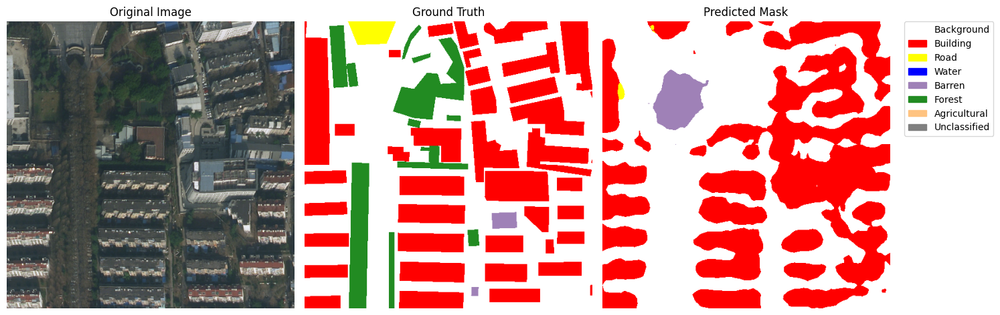

Starting epoch 4/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.2157 --- loss_adv at batch 0: 8.6851 --- 

  3%|▎         | 1/38 [00:02<01:33,  2.53s/it]

loss_disc at batch 0: 9.3084


 13%|█▎        | 5/38 [00:06<00:33,  1.01s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.2384 --- loss_adv at batch 5: 8.4951 --- 

 16%|█▌        | 6/38 [00:06<00:25,  1.26it/s]

loss_disc at batch 5: 9.1318


 26%|██▋       | 10/38 [00:08<00:16,  1.70it/s]


[losses are unscaled] loss_pidnet at batch 10: 7.0406 --- loss_adv at batch 10: 7.4439 --- 

 29%|██▉       | 11/38 [00:09<00:19,  1.36it/s]

loss_disc at batch 10: 10.8768


 39%|███▉      | 15/38 [00:13<00:20,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.1339 --- loss_adv at batch 15: 8.6951 --- 

 42%|████▏     | 16/38 [00:14<00:19,  1.12it/s]

loss_disc at batch 15: 9.2127


 53%|█████▎    | 20/38 [00:16<00:10,  1.74it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.2148 --- loss_adv at batch 20: 7.2024 --- 

 55%|█████▌    | 21/38 [00:16<00:10,  1.59it/s]

loss_disc at batch 20: 11.8252


 66%|██████▌   | 25/38 [00:20<00:11,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.3469 --- loss_adv at batch 25: 8.6309 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.11it/s]

loss_disc at batch 25: 9.0211


 79%|███████▉  | 30/38 [00:24<00:05,  1.37it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.2530 --- loss_adv at batch 30: 7.0254 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.61it/s]

loss_disc at batch 30: 12.0994


 92%|█████████▏| 35/38 [00:27<00:02,  1.44it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.3548 --- loss_adv at batch 35: 7.1496 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.59it/s]

loss_disc at batch 35: 12.2722


100%|██████████| 38/38 [00:30<00:00,  1.26it/s]
9it [00:07,  1.29it/s]


[EPOCH 04] Avg. Losses:
loss_complete        0.306245
loss_pidnet          0.264157
loss_adv             0.328114
loss_disc            0.420553
loss_pidnet_wtd      0.264157
loss_adv_wtd         0.000033
loss_disc_wtd        0.042055
Validation
mIoU on Urban: 0.24999769032001495


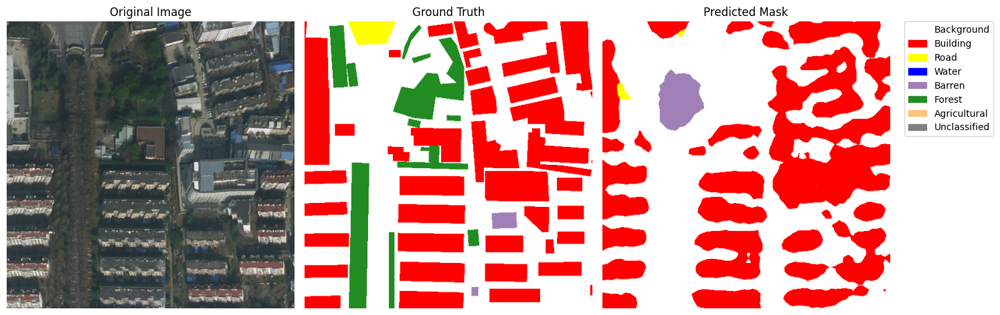

Starting epoch 5/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.1520 --- loss_adv at batch 0: 9.0161 --- 

  3%|▎         | 1/38 [00:02<01:32,  2.51s/it]

loss_disc at batch 0: 8.9682


 13%|█▎        | 5/38 [00:04<00:23,  1.43it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.5192 --- loss_adv at batch 5: 6.2295 --- 

 16%|█▌        | 6/38 [00:05<00:19,  1.60it/s]

loss_disc at batch 5: 11.0590


 26%|██▋       | 10/38 [00:08<00:18,  1.49it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.2835 --- loss_adv at batch 10: 8.5129 --- 

 29%|██▉       | 11/38 [00:09<00:25,  1.05it/s]

loss_disc at batch 10: 9.3238


 39%|███▉      | 15/38 [00:13<00:20,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.2817 --- loss_adv at batch 15: 8.6499 --- 

 42%|████▏     | 16/38 [00:13<00:16,  1.36it/s]

loss_disc at batch 15: 9.1460


 53%|█████▎    | 20/38 [00:15<00:10,  1.72it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.4621 --- loss_adv at batch 20: 7.3691 --- 

 55%|█████▌    | 21/38 [00:16<00:12,  1.40it/s]

loss_disc at batch 20: 11.0251


 66%|██████▌   | 25/38 [00:20<00:11,  1.14it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.1768 --- loss_adv at batch 25: 8.8717 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.14it/s]

loss_disc at batch 25: 8.9966


 79%|███████▉  | 30/38 [00:23<00:04,  1.74it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.7077 --- loss_adv at batch 30: 7.7706 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.51it/s]

loss_disc at batch 30: 11.6052


 92%|█████████▏| 35/38 [00:27<00:02,  1.09it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.1851 --- loss_adv at batch 35: 8.7655 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.10it/s]

loss_disc at batch 35: 9.2024


100%|██████████| 38/38 [00:30<00:00,  1.24it/s]
9it [00:06,  1.29it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2528173625469208
[EPOCH 05] Avg. Losses:
loss_complete        0.305898
loss_pidnet          0.264319
loss_adv             0.327654
loss_disc            0.415458
loss_pidnet_wtd      0.264319
loss_adv_wtd         0.000033
loss_disc_wtd        0.041546
Validation
mIoU on Urban: 0.2528173625469208


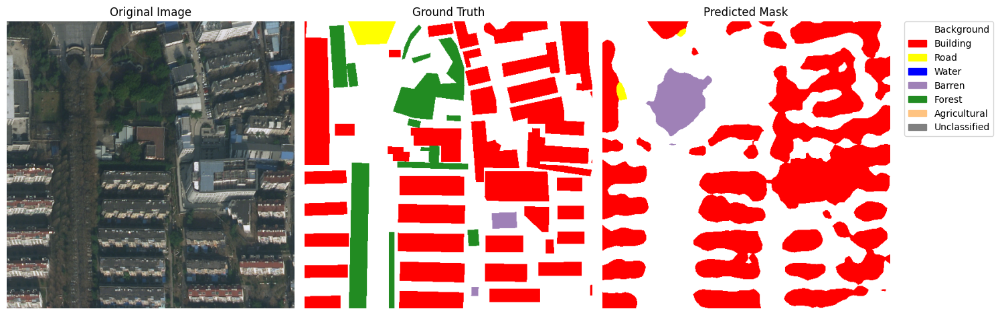

Starting epoch 6/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.3244 --- loss_adv at batch 0: 8.6110 --- 

  3%|▎         | 1/38 [00:02<01:32,  2.51s/it]

loss_disc at batch 0: 8.8496


 13%|█▎        | 5/38 [00:04<00:27,  1.22it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.5529 --- loss_adv at batch 5: 6.3544 --- 

 16%|█▌        | 6/38 [00:05<00:22,  1.42it/s]

loss_disc at batch 5: 10.4888


 26%|██▋       | 10/38 [00:09<00:26,  1.08it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.2314 --- loss_adv at batch 10: 8.3638 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.09it/s]

loss_disc at batch 10: 8.9025


 39%|███▉      | 15/38 [00:12<00:14,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.8267 --- loss_adv at batch 15: 7.3410 --- 

 42%|████▏     | 16/38 [00:13<00:12,  1.74it/s]

loss_disc at batch 15: 11.7997


 53%|█████▎    | 20/38 [00:15<00:11,  1.55it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3108 --- loss_adv at batch 20: 8.6236 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.11it/s]

loss_disc at batch 20: 9.2411


 66%|██████▌   | 25/38 [00:20<00:11,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 25: 5.9605 --- loss_adv at batch 25: 8.9133 --- 

 68%|██████▊   | 26/38 [00:21<00:08,  1.37it/s]

loss_disc at batch 25: 8.7795


 79%|███████▉  | 30/38 [00:23<00:04,  1.66it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.8091 --- loss_adv at batch 30: 6.7468 --- 

 82%|████████▏ | 31/38 [00:24<00:05,  1.36it/s]

loss_disc at batch 30: 11.0402


 92%|█████████▏| 35/38 [00:28<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 5.9351 --- loss_adv at batch 35: 8.5296 --- 

 95%|█████████▍| 36/38 [00:29<00:01,  1.13it/s]

loss_disc at batch 35: 9.1701


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:07,  1.28it/s]


[EPOCH 06] Avg. Losses:
loss_complete        0.306418
loss_pidnet          0.264699
loss_adv             0.329234
loss_disc            0.416857
loss_pidnet_wtd      0.264699
loss_adv_wtd         0.000033
loss_disc_wtd        0.041686
Validation
mIoU on Urban: 0.24789275228977203


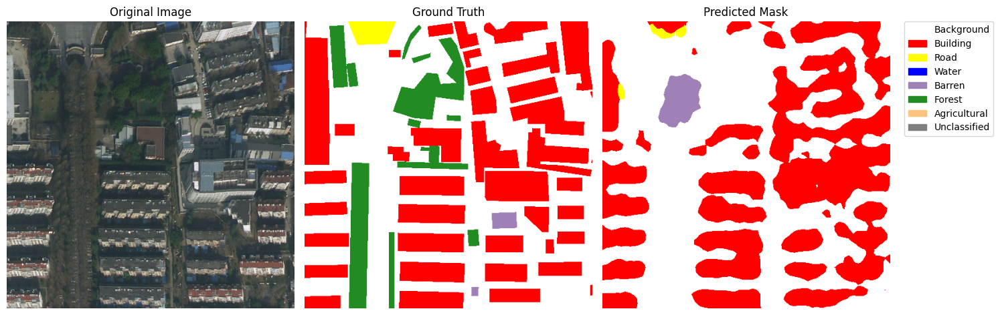

Starting epoch 7/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.2304 --- loss_adv at batch 0: 6.8023 --- 

  3%|▎         | 1/38 [00:01<01:12,  1.97s/it]

loss_disc at batch 0: 11.4088


 13%|█▎        | 5/38 [00:04<00:28,  1.14it/s]


[losses are unscaled] loss_pidnet at batch 5: 7.0285 --- loss_adv at batch 5: 7.1356 --- 

 16%|█▌        | 6/38 [00:05<00:23,  1.35it/s]

loss_disc at batch 5: 10.0963


 26%|██▋       | 10/38 [00:09<00:25,  1.08it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.0193 --- loss_adv at batch 10: 8.6258 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.10it/s]

loss_disc at batch 10: 9.1530


 39%|███▉      | 15/38 [00:12<00:15,  1.51it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.6105 --- loss_adv at batch 15: 6.4960 --- 

 42%|████▏     | 16/38 [00:13<00:13,  1.65it/s]

loss_disc at batch 15: 10.3678


 53%|█████▎    | 20/38 [00:16<00:16,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.5794 --- loss_adv at batch 20: 8.8619 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.12it/s]

loss_disc at batch 20: 8.9544


 66%|██████▌   | 25/38 [00:20<00:08,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.6960 --- loss_adv at batch 25: 7.2878 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.73it/s]

loss_disc at batch 25: 9.6589


 79%|███████▉  | 30/38 [00:23<00:05,  1.57it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.2524 --- loss_adv at batch 30: 8.7358 --- 

 82%|████████▏ | 31/38 [00:24<00:06,  1.07it/s]

loss_disc at batch 30: 9.1701


 92%|█████████▏| 35/38 [00:28<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 5.9249 --- loss_adv at batch 35: 8.7524 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.36it/s]

loss_disc at batch 35: 9.1507


100%|██████████| 38/38 [00:29<00:00,  1.28it/s]
9it [00:07,  1.28it/s]


[EPOCH 07] Avg. Losses:
loss_complete        0.306363
loss_pidnet          0.264101
loss_adv             0.327930
loss_disc            0.422293
loss_pidnet_wtd      0.264101
loss_adv_wtd         0.000033
loss_disc_wtd        0.042229
Validation
mIoU on Urban: 0.2460682988166809


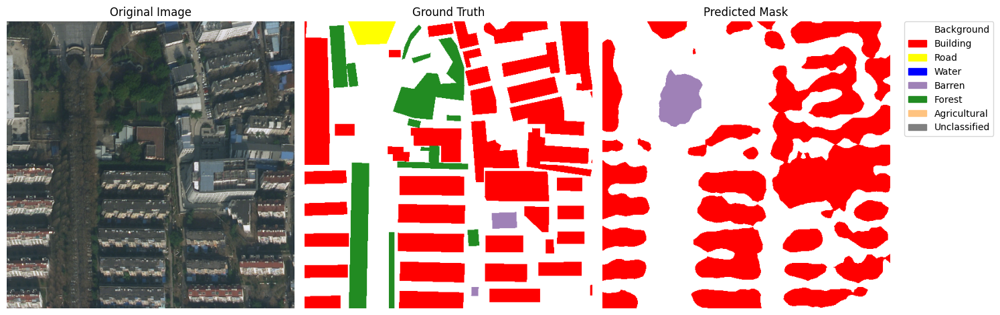

Starting epoch 8/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.6792 --- loss_adv at batch 0: 6.7486 --- 

  3%|▎         | 1/38 [00:02<01:15,  2.03s/it]

loss_disc at batch 0: 10.4736


 13%|█▎        | 5/38 [00:05<00:35,  1.08s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.2231 --- loss_adv at batch 5: 8.7224 --- 

 16%|█▌        | 6/38 [00:06<00:32,  1.01s/it]

loss_disc at batch 5: 9.3902


 26%|██▋       | 10/38 [00:09<00:20,  1.33it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.6372 --- loss_adv at batch 10: 7.6966 --- 

 29%|██▉       | 11/38 [00:09<00:16,  1.59it/s]

loss_disc at batch 10: 10.5267


 39%|███▉      | 15/38 [00:12<00:16,  1.40it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.7933 --- loss_adv at batch 15: 7.5976 --- 

 42%|████▏     | 16/38 [00:12<00:14,  1.57it/s]

loss_disc at batch 15: 10.4297


 53%|█████▎    | 20/38 [00:17<00:15,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.2411 --- loss_adv at batch 20: 8.9030 --- 

 55%|█████▌    | 21/38 [00:17<00:14,  1.14it/s]

loss_disc at batch 20: 9.1829


 66%|██████▌   | 25/38 [00:19<00:07,  1.73it/s]


[losses are unscaled] loss_pidnet at batch 25: 5.8839 --- loss_adv at batch 25: 7.0402 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.83it/s]

loss_disc at batch 25: 11.4007


 79%|███████▉  | 30/38 [00:24<00:07,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.0556 --- loss_adv at batch 30: 8.8724 --- 

 82%|████████▏ | 31/38 [00:24<00:06,  1.12it/s]

loss_disc at batch 30: 9.2270


 92%|█████████▏| 35/38 [00:27<00:01,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4566 --- loss_adv at batch 35: 7.2849 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.74it/s]

loss_disc at batch 35: 11.7910


100%|██████████| 38/38 [00:29<00:00,  1.30it/s]
9it [00:07,  1.28it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2533458471298218
[EPOCH 08] Avg. Losses:
loss_complete        0.306422
loss_pidnet          0.264189
loss_adv             0.330627
loss_disc            0.422003
loss_pidnet_wtd      0.264189
loss_adv_wtd         0.000033
loss_disc_wtd        0.042200
Validation
mIoU on Urban: 0.2533458471298218


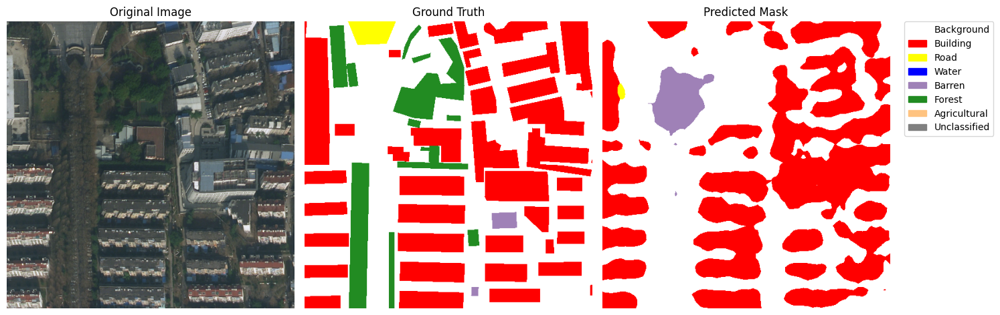

Starting epoch 9/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.8576 --- loss_adv at batch 0: 6.3943 --- 

  3%|▎         | 1/38 [00:01<01:13,  1.97s/it]

loss_disc at batch 0: 10.4884


 13%|█▎        | 5/38 [00:05<00:34,  1.04s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.3342 --- loss_adv at batch 5: 8.5293 --- 

 16%|█▌        | 6/38 [00:06<00:31,  1.02it/s]

loss_disc at batch 5: 9.3402


 26%|██▋       | 10/38 [00:08<00:16,  1.71it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.4900 --- loss_adv at batch 10: 7.7785 --- 

 29%|██▉       | 11/38 [00:09<00:16,  1.60it/s]

loss_disc at batch 10: 10.4143


 39%|███▉      | 15/38 [00:12<00:20,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 15: 5.9452 --- loss_adv at batch 15: 8.8117 --- 

 42%|████▏     | 16/38 [00:13<00:19,  1.12it/s]

loss_disc at batch 15: 9.4299


 53%|█████▎    | 20/38 [00:16<00:13,  1.38it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3297 --- loss_adv at batch 20: 7.3524 --- 

 55%|█████▌    | 21/38 [00:17<00:10,  1.63it/s]

loss_disc at batch 20: 10.6580


 66%|██████▌   | 25/38 [00:19<00:09,  1.42it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.2313 --- loss_adv at batch 25: 6.9428 --- 

 68%|██████▊   | 26/38 [00:20<00:07,  1.57it/s]

loss_disc at batch 25: 10.7182


 79%|███████▉  | 30/38 [00:24<00:07,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.0458 --- loss_adv at batch 30: 8.8391 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.13it/s]

loss_disc at batch 30: 9.2135


 92%|█████████▏| 35/38 [00:27<00:01,  1.63it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4883 --- loss_adv at batch 35: 6.5151 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.75it/s]

loss_disc at batch 35: 10.5351


100%|██████████| 38/38 [00:29<00:00,  1.30it/s]
9it [00:07,  1.27it/s]


[EPOCH 09] Avg. Losses:
loss_complete        0.306186
loss_pidnet          0.264013
loss_adv             0.326972
loss_disc            0.421407
loss_pidnet_wtd      0.264013
loss_adv_wtd         0.000033
loss_disc_wtd        0.042141
Validation
mIoU on Urban: 0.2518862187862396


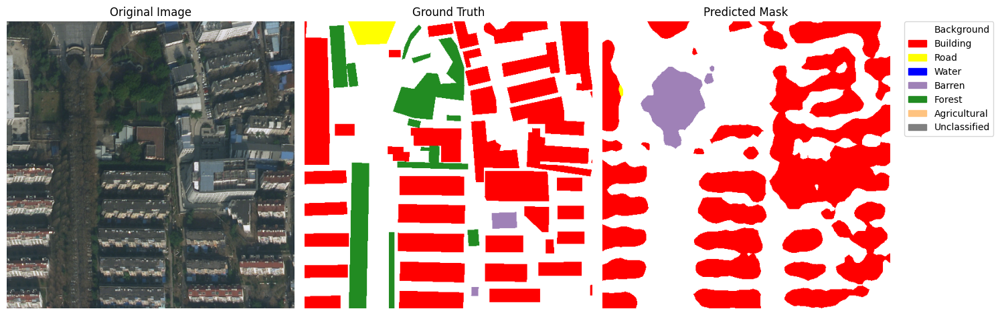

Starting epoch 10/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.3396 --- loss_adv at batch 0: 8.8216 --- 

  3%|▎         | 1/38 [00:02<01:31,  2.47s/it]

loss_disc at batch 0: 9.1379


 13%|█▎        | 5/38 [00:05<00:33,  1.01s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.2777 --- loss_adv at batch 5: 8.6521 --- 

 16%|█▌        | 6/38 [00:06<00:25,  1.26it/s]

loss_disc at batch 5: 9.3407


 26%|██▋       | 10/38 [00:08<00:16,  1.67it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.3391 --- loss_adv at batch 10: 7.2646 --- 

 29%|██▉       | 11/38 [00:09<00:19,  1.40it/s]

loss_disc at batch 10: 10.3418


 39%|███▉      | 15/38 [00:13<00:20,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.1348 --- loss_adv at batch 15: 8.6829 --- 

 42%|████▏     | 16/38 [00:14<00:19,  1.12it/s]

loss_disc at batch 15: 9.3603


 53%|█████▎    | 20/38 [00:16<00:10,  1.74it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.2284 --- loss_adv at batch 20: 6.6863 --- 

 55%|█████▌    | 21/38 [00:16<00:11,  1.53it/s]

loss_disc at batch 20: 10.3192


 66%|██████▌   | 25/38 [00:20<00:11,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 25: 5.9286 --- loss_adv at batch 25: 8.9752 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.11it/s]

loss_disc at batch 25: 9.2514


 79%|███████▉  | 30/38 [00:24<00:05,  1.37it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.6454 --- loss_adv at batch 30: 6.6596 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.62it/s]

loss_disc at batch 30: 11.9108


 92%|█████████▏| 35/38 [00:27<00:02,  1.41it/s]


[losses are unscaled] loss_pidnet at batch 35: 5.9708 --- loss_adv at batch 35: 7.2054 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.56it/s]

loss_disc at batch 35: 11.0946


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:07,  1.28it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2602400481700897
[EPOCH 10] Avg. Losses:
loss_complete        0.305122
loss_pidnet          0.263050
loss_adv             0.333470
loss_disc            0.420382
loss_pidnet_wtd      0.263050
loss_adv_wtd         0.000033
loss_disc_wtd        0.042038
Validation
mIoU on Urban: 0.2602400481700897


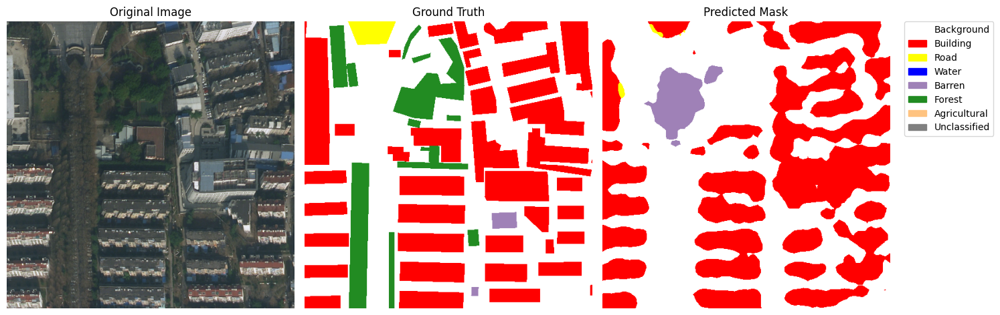

Starting epoch 11/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.3621 --- loss_adv at batch 0: 8.8166 --- 

  3%|▎         | 1/38 [00:02<01:33,  2.52s/it]

loss_disc at batch 0: 9.2944


 13%|█▎        | 5/38 [00:04<00:23,  1.43it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.1548 --- loss_adv at batch 5: 6.8065 --- 

 16%|█▌        | 6/38 [00:05<00:19,  1.61it/s]

loss_disc at batch 5: 10.2932


 26%|██▋       | 10/38 [00:08<00:19,  1.47it/s]


[losses are unscaled] loss_pidnet at batch 10: 5.9904 --- loss_adv at batch 10: 8.7293 --- 

 29%|██▉       | 11/38 [00:10<00:26,  1.03it/s]

loss_disc at batch 10: 9.3116


 39%|███▉      | 15/38 [00:13<00:20,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3279 --- loss_adv at batch 15: 8.6654 --- 

 42%|████▏     | 16/38 [00:13<00:16,  1.35it/s]

loss_disc at batch 15: 9.3029


 53%|█████▎    | 20/38 [00:15<00:10,  1.76it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3268 --- loss_adv at batch 20: 7.0668 --- 

 55%|█████▌    | 21/38 [00:16<00:11,  1.43it/s]

loss_disc at batch 20: 11.7229


 66%|██████▌   | 25/38 [00:20<00:11,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.1855 --- loss_adv at batch 25: 8.3802 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.13it/s]

loss_disc at batch 25: 9.2796


 79%|███████▉  | 30/38 [00:23<00:04,  1.74it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.7470 --- loss_adv at batch 30: 7.9585 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.61it/s]

loss_disc at batch 30: 11.8975


 92%|█████████▏| 35/38 [00:27<00:02,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 35: 5.9217 --- loss_adv at batch 35: 8.7390 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.11it/s]

loss_disc at batch 35: 8.9786


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:07,  1.28it/s]


[EPOCH 11] Avg. Losses:
loss_complete        0.305847
loss_pidnet          0.263514
loss_adv             0.335403
loss_disc            0.422990
loss_pidnet_wtd      0.263514
loss_adv_wtd         0.000034
loss_disc_wtd        0.042299
Validation
mIoU on Urban: 0.25500497221946716


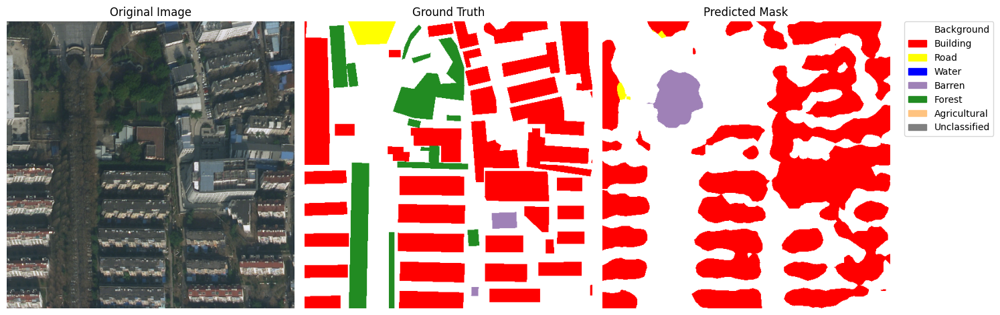

Starting epoch 12/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.1646 --- loss_adv at batch 0: 8.8521 --- 

  3%|▎         | 1/38 [00:02<01:34,  2.56s/it]

loss_disc at batch 0: 9.2271


 13%|█▎        | 5/38 [00:04<00:28,  1.18it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.4951 --- loss_adv at batch 5: 7.0915 --- 

 16%|█▌        | 6/38 [00:05<00:23,  1.39it/s]

loss_disc at batch 5: 9.5494


 26%|██▋       | 10/38 [00:09<00:26,  1.05it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.4775 --- loss_adv at batch 10: 8.7957 --- 

 29%|██▉       | 11/38 [00:10<00:25,  1.08it/s]

loss_disc at batch 10: 8.9913


 39%|███▉      | 15/38 [00:12<00:14,  1.61it/s]


[losses are unscaled] loss_pidnet at batch 15: 5.9926 --- loss_adv at batch 15: 6.8539 --- 

 42%|████▏     | 16/38 [00:13<00:12,  1.74it/s]

loss_disc at batch 15: 9.8818


 53%|█████▎    | 20/38 [00:16<00:11,  1.55it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3565 --- loss_adv at batch 20: 8.7972 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.12it/s]

loss_disc at batch 20: 9.0794


 66%|██████▌   | 25/38 [00:20<00:11,  1.14it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.2362 --- loss_adv at batch 25: 8.7443 --- 

 68%|██████▊   | 26/38 [00:21<00:08,  1.37it/s]

loss_disc at batch 25: 9.0744


 79%|███████▉  | 30/38 [00:23<00:04,  1.65it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.4967 --- loss_adv at batch 30: 7.5099 --- 

 82%|████████▏ | 31/38 [00:24<00:05,  1.36it/s]

loss_disc at batch 30: 10.8065


 92%|█████████▏| 35/38 [00:28<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.1433 --- loss_adv at batch 35: 8.8160 --- 

 95%|█████████▍| 36/38 [00:29<00:01,  1.12it/s]

loss_disc at batch 35: 9.3646


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:06,  1.29it/s]


[EPOCH 12] Avg. Losses:
loss_complete        0.303578
loss_pidnet          0.261933
loss_adv             0.333312
loss_disc            0.416114
loss_pidnet_wtd      0.261933
loss_adv_wtd         0.000033
loss_disc_wtd        0.041611
Validation
mIoU on Urban: 0.2534826397895813


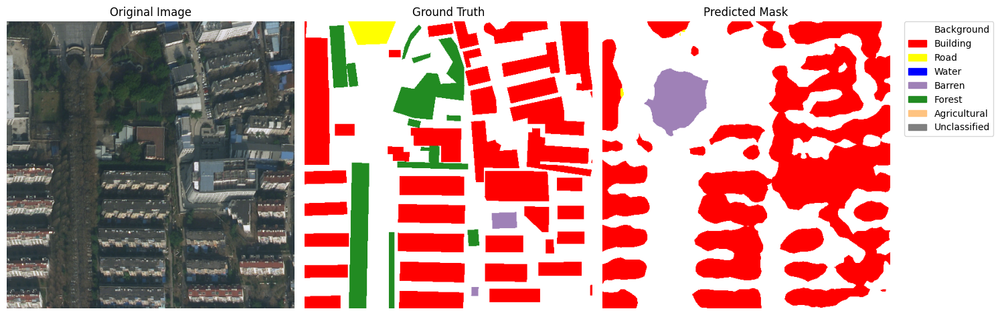

Starting epoch 13/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.6914 --- loss_adv at batch 0: 6.8666 --- 

  3%|▎         | 1/38 [00:01<01:11,  1.95s/it]

loss_disc at batch 0: 11.4088


 13%|█▎        | 5/38 [00:04<00:29,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.7101 --- loss_adv at batch 5: 7.0691 --- 

 16%|█▌        | 6/38 [00:05<00:23,  1.34it/s]

loss_disc at batch 5: 11.3585


 26%|██▋       | 10/38 [00:09<00:25,  1.09it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.7297 --- loss_adv at batch 10: 8.8965 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.11it/s]

loss_disc at batch 10: 9.3353


 39%|███▉      | 15/38 [00:12<00:15,  1.53it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.4678 --- loss_adv at batch 15: 7.0658 --- 

 42%|████▏     | 16/38 [00:12<00:13,  1.67it/s]

loss_disc at batch 15: 10.8349


 53%|█████▎    | 20/38 [00:16<00:16,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3761 --- loss_adv at batch 20: 8.7606 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.13it/s]

loss_disc at batch 20: 9.0871


 66%|██████▌   | 25/38 [00:20<00:08,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.5733 --- loss_adv at batch 25: 8.0491 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.74it/s]

loss_disc at batch 25: 11.3223


 79%|███████▉  | 30/38 [00:23<00:05,  1.56it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.2095 --- loss_adv at batch 30: 9.0112 --- 

 82%|████████▏ | 31/38 [00:24<00:06,  1.08it/s]

loss_disc at batch 30: 9.3602


 92%|█████████▏| 35/38 [00:28<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4929 --- loss_adv at batch 35: 8.9790 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.36it/s]

loss_disc at batch 35: 9.0963


100%|██████████| 38/38 [00:29<00:00,  1.28it/s]
9it [00:07,  1.28it/s]


[EPOCH 13] Avg. Losses:
loss_complete        0.305742
loss_pidnet          0.263453
loss_adv             0.329756
loss_disc            0.422566
loss_pidnet_wtd      0.263453
loss_adv_wtd         0.000033
loss_disc_wtd        0.042257
Validation
mIoU on Urban: 0.25693032145500183


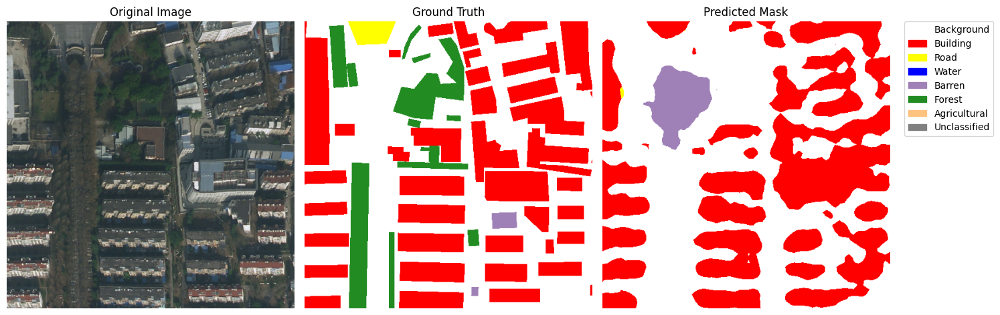

Starting epoch 14/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.2363 --- loss_adv at batch 0: 6.9417 --- 

  3%|▎         | 1/38 [00:01<01:12,  1.95s/it]

loss_disc at batch 0: 11.1308


 13%|█▎        | 5/38 [00:05<00:35,  1.08s/it]


[losses are unscaled] loss_pidnet at batch 5: 5.9916 --- loss_adv at batch 5: 8.9600 --- 

 16%|█▌        | 6/38 [00:06<00:32,  1.01s/it]

loss_disc at batch 5: 8.8256


 26%|██▋       | 10/38 [00:09<00:20,  1.34it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.5013 --- loss_adv at batch 10: 7.0562 --- 

 29%|██▉       | 11/38 [00:09<00:16,  1.60it/s]

loss_disc at batch 10: 11.4656


 39%|███▉      | 15/38 [00:12<00:17,  1.35it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3029 --- loss_adv at batch 15: 7.2232 --- 

 42%|████▏     | 16/38 [00:13<00:14,  1.52it/s]

loss_disc at batch 15: 11.5927


 53%|█████▎    | 20/38 [00:17<00:16,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.0719 --- loss_adv at batch 20: 8.8725 --- 

 55%|█████▌    | 21/38 [00:18<00:15,  1.13it/s]

loss_disc at batch 20: 9.1533


 66%|██████▌   | 25/38 [00:19<00:07,  1.66it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.6439 --- loss_adv at batch 25: 7.2356 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.77it/s]

loss_disc at batch 25: 10.7654


 79%|███████▉  | 30/38 [00:24<00:07,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 30: 5.9959 --- loss_adv at batch 30: 8.7826 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.11it/s]

loss_disc at batch 30: 8.9773


 92%|█████████▏| 35/38 [00:27<00:01,  1.61it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.5082 --- loss_adv at batch 35: 7.0060 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.73it/s]

loss_disc at batch 35: 10.3414


100%|██████████| 38/38 [00:29<00:00,  1.29it/s]
9it [00:07,  1.26it/s]


[EPOCH 14] Avg. Losses:
loss_complete        0.305332
loss_pidnet          0.262754
loss_adv             0.330833
loss_disc            0.425450
loss_pidnet_wtd      0.262754
loss_adv_wtd         0.000033
loss_disc_wtd        0.042545
Validation
mIoU on Urban: 0.2582641839981079


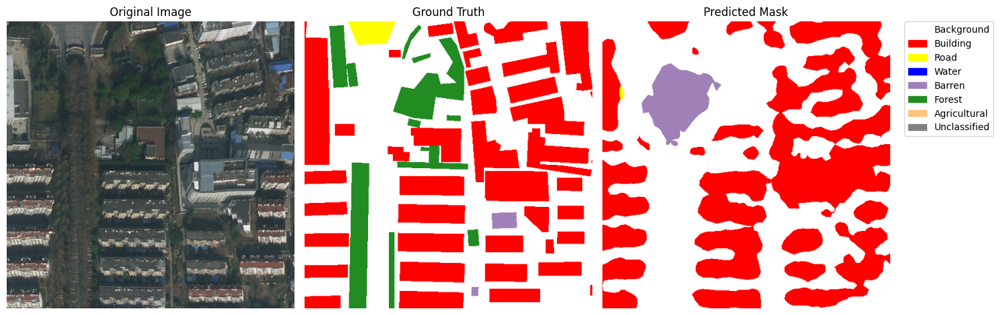

Starting epoch 15/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.5744 --- loss_adv at batch 0: 8.0230 --- 

  3%|▎         | 1/38 [00:01<01:12,  1.97s/it]

loss_disc at batch 0: 10.6948


 13%|█▎        | 5/38 [00:05<00:34,  1.03s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.3329 --- loss_adv at batch 5: 9.0974 --- 

 16%|█▌        | 6/38 [00:06<00:31,  1.02it/s]

loss_disc at batch 5: 9.0926


 26%|██▋       | 10/38 [00:08<00:16,  1.71it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.9888 --- loss_adv at batch 10: 7.0309 --- 

 29%|██▉       | 11/38 [00:09<00:18,  1.49it/s]

loss_disc at batch 10: 11.0362


 39%|███▉      | 15/38 [00:12<00:20,  1.10it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3202 --- loss_adv at batch 15: 8.9726 --- 

 42%|████▏     | 16/38 [00:13<00:19,  1.11it/s]

loss_disc at batch 15: 9.3767


 53%|█████▎    | 20/38 [00:16<00:13,  1.38it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.0869 --- loss_adv at batch 20: 7.3141 --- 

 55%|█████▌    | 21/38 [00:17<00:10,  1.63it/s]

loss_disc at batch 20: 11.8970


 66%|██████▌   | 25/38 [00:19<00:08,  1.45it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.2316 --- loss_adv at batch 25: 7.3439 --- 

 68%|██████▊   | 26/38 [00:20<00:07,  1.60it/s]

loss_disc at batch 25: 11.0767


 79%|███████▉  | 30/38 [00:24<00:07,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.1923 --- loss_adv at batch 30: 8.9170 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.13it/s]

loss_disc at batch 30: 9.0853


 92%|█████████▏| 35/38 [00:27<00:01,  1.52it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.1411 --- loss_adv at batch 35: 7.3962 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.66it/s]

loss_disc at batch 35: 10.5986


100%|██████████| 38/38 [00:29<00:00,  1.29it/s]
9it [00:06,  1.29it/s]


[EPOCH 15] Avg. Losses:
loss_complete        0.305326
loss_pidnet          0.262735
loss_adv             0.334897
loss_disc            0.425580
loss_pidnet_wtd      0.262735
loss_adv_wtd         0.000033
loss_disc_wtd        0.042558
Validation
mIoU on Urban: 0.25375017523765564


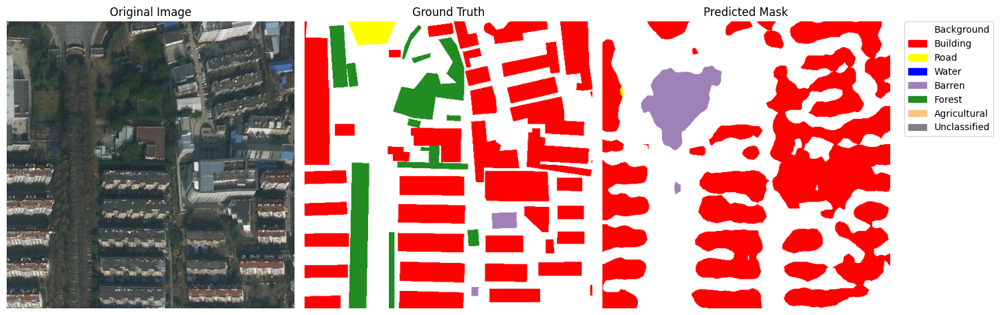

Starting epoch 16/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 5.9606 --- loss_adv at batch 0: 8.6823 --- 

  3%|▎         | 1/38 [00:02<01:31,  2.47s/it]

loss_disc at batch 0: 9.0023


 13%|█▎        | 5/38 [00:05<00:33,  1.01s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.0912 --- loss_adv at batch 5: 8.6702 --- 

 16%|█▌        | 6/38 [00:06<00:25,  1.26it/s]

loss_disc at batch 5: 9.2277


 26%|██▋       | 10/38 [00:08<00:17,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.5546 --- loss_adv at batch 10: 7.0059 --- 

 29%|██▉       | 11/38 [00:09<00:19,  1.35it/s]

loss_disc at batch 10: 10.9133


 39%|███▉      | 15/38 [00:13<00:20,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 15: 5.8512 --- loss_adv at batch 15: 8.7985 --- 

 42%|████▏     | 16/38 [00:14<00:19,  1.12it/s]

loss_disc at batch 15: 9.1477


 53%|█████▎    | 20/38 [00:16<00:10,  1.74it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.4827 --- loss_adv at batch 20: 7.2154 --- 

 55%|█████▌    | 21/38 [00:16<00:10,  1.65it/s]

loss_disc at batch 20: 11.6504


 66%|██████▌   | 25/38 [00:20<00:11,  1.08it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.0160 --- loss_adv at batch 25: 8.7324 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.10it/s]

loss_disc at batch 25: 9.3682


 79%|███████▉  | 30/38 [00:24<00:05,  1.36it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.4705 --- loss_adv at batch 30: 6.5653 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.61it/s]

loss_disc at batch 30: 11.0233


 92%|█████████▏| 35/38 [00:27<00:02,  1.42it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.3756 --- loss_adv at batch 35: 7.6449 --- 

 95%|█████████▍| 36/38 [00:27<00:01,  1.57it/s]

loss_disc at batch 35: 10.6428


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:07,  1.29it/s]


[EPOCH 16] Avg. Losses:
loss_complete        0.305067
loss_pidnet          0.263045
loss_adv             0.336393
loss_disc            0.419888
loss_pidnet_wtd      0.263045
loss_adv_wtd         0.000034
loss_disc_wtd        0.041989
Validation
mIoU on Urban: 0.25949302315711975


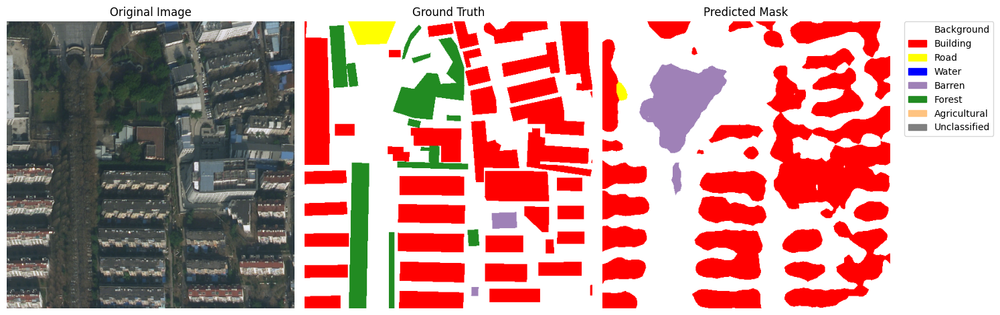

Starting epoch 17/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.0332 --- loss_adv at batch 0: 8.7485 --- 

  3%|▎         | 1/38 [00:02<01:29,  2.43s/it]

loss_disc at batch 0: 9.3042


 13%|█▎        | 5/38 [00:04<00:22,  1.45it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.3084 --- loss_adv at batch 5: 6.5754 --- 

 16%|█▌        | 6/38 [00:05<00:19,  1.62it/s]

loss_disc at batch 5: 11.5906


 26%|██▋       | 10/38 [00:08<00:19,  1.47it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.2853 --- loss_adv at batch 10: 8.5895 --- 

 29%|██▉       | 11/38 [00:09<00:26,  1.04it/s]

loss_disc at batch 10: 9.1711


 39%|███▉      | 15/38 [00:13<00:20,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3697 --- loss_adv at batch 15: 8.8629 --- 

 42%|████▏     | 16/38 [00:13<00:16,  1.36it/s]

loss_disc at batch 15: 9.2534


 53%|█████▎    | 20/38 [00:15<00:10,  1.69it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.5409 --- loss_adv at batch 20: 6.6963 --- 

 55%|█████▌    | 21/38 [00:16<00:12,  1.40it/s]

loss_disc at batch 20: 11.2997


 66%|██████▌   | 25/38 [00:20<00:11,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.5566 --- loss_adv at batch 25: 8.8318 --- 

 68%|██████▊   | 26/38 [00:21<00:10,  1.13it/s]

loss_disc at batch 25: 9.3286


 79%|███████▉  | 30/38 [00:23<00:04,  1.73it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.4212 --- loss_adv at batch 30: 6.9207 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.63it/s]

loss_disc at batch 30: 11.1286


 92%|█████████▏| 35/38 [00:27<00:02,  1.11it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4541 --- loss_adv at batch 35: 9.1171 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.12it/s]

loss_disc at batch 35: 9.5158


100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
9it [00:06,  1.29it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.26062270998954773
[EPOCH 17] Avg. Losses:
loss_complete        0.304087
loss_pidnet          0.261857
loss_adv             0.336927
loss_disc            0.421971
loss_pidnet_wtd      0.261857
loss_adv_wtd         0.000034
loss_disc_wtd        0.042197
Validation
mIoU on Urban: 0.26062270998954773


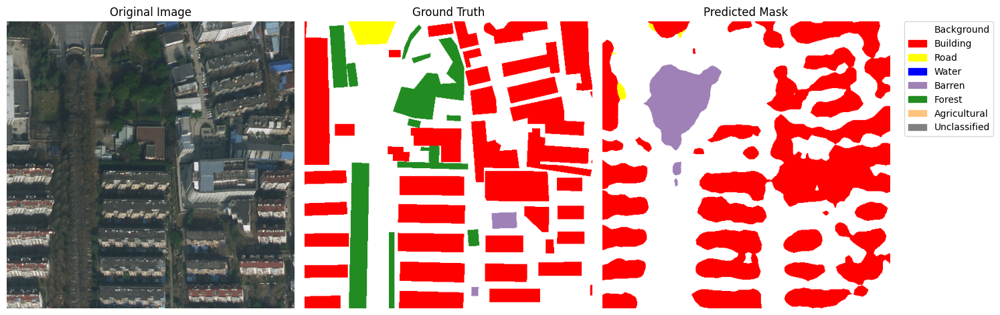

Starting epoch 18/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.4281 --- loss_adv at batch 0: 9.1083 --- 

  3%|▎         | 1/38 [00:02<01:30,  2.43s/it]

loss_disc at batch 0: 9.4152


 13%|█▎        | 5/38 [00:04<00:28,  1.17it/s]


[losses are unscaled] loss_pidnet at batch 5: 5.9404 --- loss_adv at batch 5: 7.9873 --- 

 16%|█▌        | 6/38 [00:05<00:23,  1.37it/s]

loss_disc at batch 5: 11.2866


 26%|██▋       | 10/38 [00:09<00:26,  1.06it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.2657 --- loss_adv at batch 10: 8.9896 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.09it/s]

loss_disc at batch 10: 9.3159


 39%|███▉      | 15/38 [00:12<00:14,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3477 --- loss_adv at batch 15: 7.4401 --- 

 42%|████▏     | 16/38 [00:13<00:12,  1.74it/s]

loss_disc at batch 15: 10.5647


 53%|█████▎    | 20/38 [00:15<00:11,  1.60it/s]


[losses are unscaled] loss_pidnet at batch 20: 5.9041 --- loss_adv at batch 20: 8.8664 --- 

 55%|█████▌    | 21/38 [00:17<00:14,  1.15it/s]

loss_disc at batch 20: 9.0196


 66%|██████▌   | 25/38 [00:20<00:11,  1.14it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.0170 --- loss_adv at batch 25: 8.9543 --- 

 68%|██████▊   | 26/38 [00:21<00:08,  1.38it/s]

loss_disc at batch 25: 9.4578


 79%|███████▉  | 30/38 [00:23<00:04,  1.69it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.1066 --- loss_adv at batch 30: 8.3440 --- 

 82%|████████▏ | 31/38 [00:24<00:04,  1.42it/s]

loss_disc at batch 30: 11.6402


 92%|█████████▏| 35/38 [00:27<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.0300 --- loss_adv at batch 35: 8.8749 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.12it/s]

loss_disc at batch 35: 9.2244


100%|██████████| 38/38 [00:30<00:00,  1.26it/s]
9it [00:06,  1.29it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2638915181159973
[EPOCH 18] Avg. Losses:
loss_complete        0.303337
loss_pidnet          0.260842
loss_adv             0.339809
loss_disc            0.424603
loss_pidnet_wtd      0.260842
loss_adv_wtd         0.000034
loss_disc_wtd        0.042460
Validation
mIoU on Urban: 0.2638915181159973


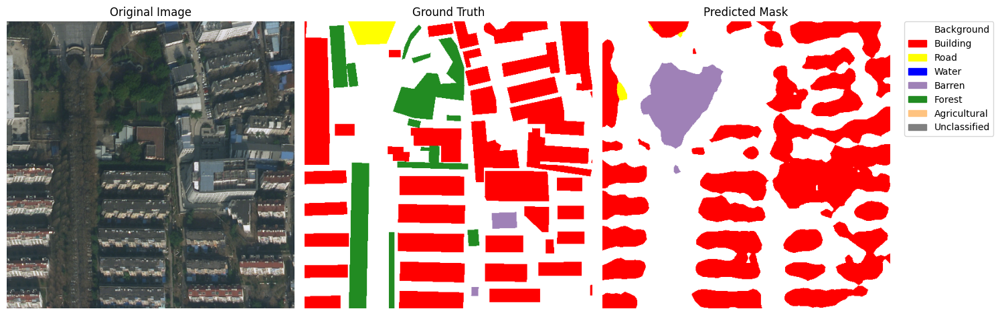

Starting epoch 19/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.2647 --- loss_adv at batch 0: 7.7882 --- 

  3%|▎         | 1/38 [00:01<01:11,  1.94s/it]

loss_disc at batch 0: 10.9766


 13%|█▎        | 5/38 [00:05<00:30,  1.09it/s]


[losses are unscaled] loss_pidnet at batch 5: 6.4283 --- loss_adv at batch 5: 7.3094 --- 

 16%|█▌        | 6/38 [00:05<00:24,  1.30it/s]

loss_disc at batch 5: 11.3806


 26%|██▋       | 10/38 [00:09<00:25,  1.08it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.0587 --- loss_adv at batch 10: 8.8767 --- 

 29%|██▉       | 11/38 [00:10<00:24,  1.10it/s]

loss_disc at batch 10: 9.2188


 39%|███▉      | 15/38 [00:12<00:13,  1.67it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.3944 --- loss_adv at batch 15: 7.5480 --- 

 42%|████▏     | 16/38 [00:12<00:12,  1.78it/s]

loss_disc at batch 15: 12.3216


 53%|█████▎    | 20/38 [00:16<00:15,  1.13it/s]


[losses are unscaled] loss_pidnet at batch 20: 5.9859 --- loss_adv at batch 20: 8.8136 --- 

 55%|█████▌    | 21/38 [00:17<00:15,  1.13it/s]

loss_disc at batch 20: 9.1176


 66%|██████▌   | 25/38 [00:20<00:08,  1.60it/s]


[losses are unscaled] loss_pidnet at batch 25: 6.4214 --- loss_adv at batch 25: 6.8594 --- 

 68%|██████▊   | 26/38 [00:20<00:07,  1.71it/s]

loss_disc at batch 25: 11.6241


 79%|███████▉  | 30/38 [00:23<00:05,  1.52it/s]


[losses are unscaled] loss_pidnet at batch 30: 5.9577 --- loss_adv at batch 30: 9.0916 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.08it/s]

loss_disc at batch 30: 9.1364


 92%|█████████▏| 35/38 [00:28<00:02,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.3112 --- loss_adv at batch 35: 8.9679 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.36it/s]

loss_disc at batch 35: 9.3521


100%|██████████| 38/38 [00:29<00:00,  1.27it/s]
9it [00:07,  1.28it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2645523250102997
[EPOCH 19] Avg. Losses:
loss_complete        0.304632
loss_pidnet          0.261362
loss_adv             0.336878
loss_disc            0.432365
loss_pidnet_wtd      0.261362
loss_adv_wtd         0.000034
loss_disc_wtd        0.043237
Validation
mIoU on Urban: 0.2645523250102997


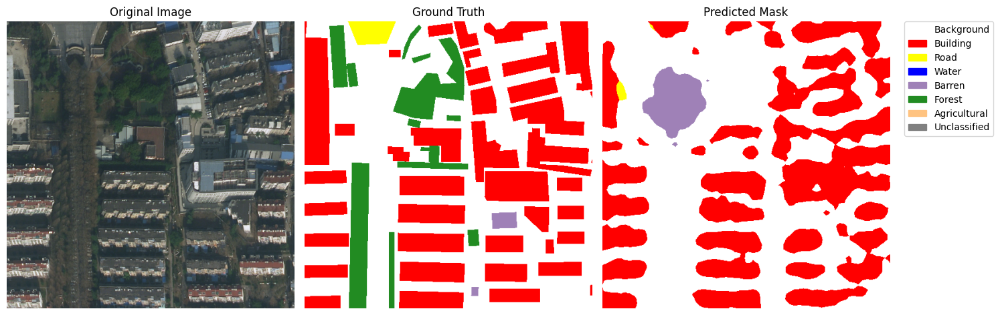

Starting epoch 20/20, LR = [0.0001], DISC_LR = [0.0005]
len of source_loader is 38, len of target_loader is 45. WARNING: make sure source is shorter than target, or modify code to fix early stopping


  0%|          | 0/38 [00:00<?, ?it/s]


[losses are unscaled] loss_pidnet at batch 0: 6.4615 --- loss_adv at batch 0: 7.7475 --- 

  3%|▎         | 1/38 [00:02<01:14,  2.01s/it]

loss_disc at batch 0: 11.4368


 13%|█▎        | 5/38 [00:05<00:35,  1.09s/it]


[losses are unscaled] loss_pidnet at batch 5: 6.3260 --- loss_adv at batch 5: 8.8404 --- 

 16%|█▌        | 6/38 [00:06<00:32,  1.02s/it]

loss_disc at batch 5: 9.4139


 26%|██▋       | 10/38 [00:09<00:20,  1.33it/s]


[losses are unscaled] loss_pidnet at batch 10: 6.0475 --- loss_adv at batch 10: 6.5973 --- 

 29%|██▉       | 11/38 [00:09<00:16,  1.59it/s]

loss_disc at batch 10: 11.3100


 39%|███▉      | 15/38 [00:12<00:16,  1.38it/s]


[losses are unscaled] loss_pidnet at batch 15: 6.4270 --- loss_adv at batch 15: 6.2698 --- 

 42%|████▏     | 16/38 [00:12<00:14,  1.54it/s]

loss_disc at batch 15: 11.4527


 53%|█████▎    | 20/38 [00:17<00:16,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 20: 6.3091 --- loss_adv at batch 20: 8.8057 --- 

 55%|█████▌    | 21/38 [00:18<00:15,  1.13it/s]

loss_disc at batch 20: 9.1967


 66%|██████▌   | 25/38 [00:19<00:08,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 25: 5.8556 --- loss_adv at batch 25: 7.3645 --- 

 68%|██████▊   | 26/38 [00:20<00:06,  1.74it/s]

loss_disc at batch 25: 11.0857


 79%|███████▉  | 30/38 [00:24<00:07,  1.12it/s]


[losses are unscaled] loss_pidnet at batch 30: 6.1613 --- loss_adv at batch 30: 8.9762 --- 

 82%|████████▏ | 31/38 [00:25<00:06,  1.13it/s]

loss_disc at batch 30: 9.3864


 92%|█████████▏| 35/38 [00:27<00:01,  1.62it/s]


[losses are unscaled] loss_pidnet at batch 35: 6.4007 --- loss_adv at batch 35: 6.9786 --- 

 95%|█████████▍| 36/38 [00:28<00:01,  1.74it/s]

loss_disc at batch 35: 11.0320


100%|██████████| 38/38 [00:29<00:00,  1.29it/s]
9it [00:07,  1.28it/s]


BEST MODEL ON VALIDATION SET, SAVING
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth model succesfully saved on drive. URBAN mIoU went down to 0.2665202021598816
best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5.pth_20.pth succesfully saved on drive. loss went down to inf
[EPOCH 20] Avg. Losses:
loss_complete        0.304392
loss_pidnet          0.261707
loss_adv             0.333577
loss_disc            0.426522
loss_pidnet_wtd      0.261707
loss_adv_wtd         0.000033
loss_disc_wtd        0.042652
Validation
mIoU on Urban: 0.2665202021598816


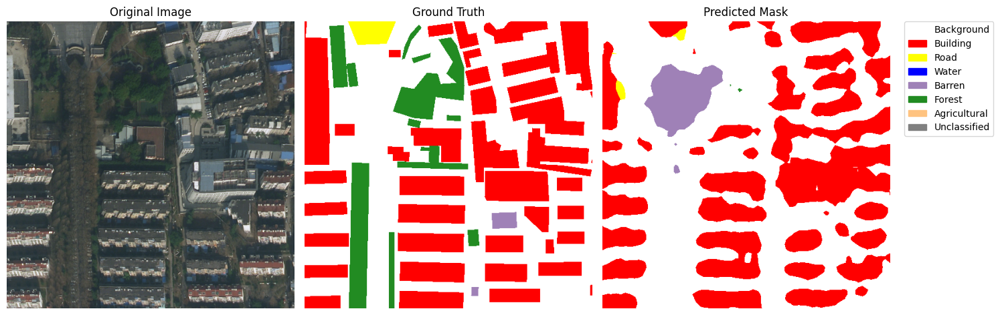

In [51]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import numpy as np

# For easier debugging
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
os.environ['TORCH_USE_CUDA_DSA'] = '1'

TYPE = 'Train'

use_boundary_2 = True
use_boundary_4 = True
use_boundary_8 = True

for LAMBDA_ADV in LAMBDA_ADVs:
    charge = 0
    spike_disc = 5
    spike_pidnet = 5
    useChargeSpike = True
    SAVE_MODEL_AS = f'best_DA_STDC_model_LA={LAMBDA_ADV}_LD={LAMBDA_DISC}_LRdisc={DISC_LR}_s={spike_disc}_spid={spike_pidnet}.pth'
    SAVE_DISC_MODEL_AS = f'best_disc_model_{CHOOSE_TRANSFORM}_LS={LAMBDA_SEG}_LA={LAMBDA_ADV}_LD={LAMBDA_DISC}.pth'
    MODEL_NAME = SAVE_MODEL_AS

    current_step = 0

    best_loss = float('inf')
    best_model = model.state_dict()
    disc_best_model = disc_model.state_dict()

    model = model.to(DEVICE)
    disc_model = disc_model.to(DEVICE)
    print(f"DEVICE is {DEVICE}. Loss scales are: LAMBDA_SEG={LAMBDA_SEG}, LAMBDA_ADV={LAMBDA_ADV}, LAMBDA_DISC={LAMBDA_DISC}")

    plot_losses = {
        'adv' : [],
        'disc' : [],
        'complete' : [],
        'pidnet' : [],
    }

    batch_losses = {
        'adv' : [],
        'disc' : [],
        'complete' : [],
        'pidnet' : [],
    }


    objective = 'discriminator'
    best_mIoU_s = 0

    #mIoU before
    model.eval()
    total_union_t = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_intersection_t = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_union_s = torch.zeros(NUM_CLASSES).to(DEVICE)
    total_intersection_s = torch.zeros(NUM_CLASSES).to(DEVICE)
    with torch.no_grad():
        for batch_i, batch_s in tqdm(enumerate(source_validation_loader)):
            images, masks, _, bd_gts = batch_s
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            bd_gts = bd_gts.float().to(DEVICE)
            outputs = model(images)
            h, w = masks.size(1), masks.size(2)
            ph, pw = outputs[0].size(2), outputs[0].size(3)
            if ph != h or pw != w:
                for i in range(len(outputs)):
                    outputs[i] = F.interpolate(outputs[i], size=(h, w), mode='bilinear', align_corners=True)

            ### ========> Calculate mIoU
            ## mIoU on source
            class_indices_s = torch.argmax(outputs[1], dim=1)

            for predicted, target in zip(class_indices_s, masks):
                for i in range(NUM_CLASSES):
                    total_intersection_s[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                    total_union_s[i] += torch.sum(torch.logical_or(predicted == i, target == i))

    intersection_over_union_s = total_intersection_s / total_union_s
    mIoU_s = torch.mean(intersection_over_union_s)
    print(f"mIoU on source before training: {mIoU_s}")


    if TYPE == 'Train':
        for epoch in range(NUM_EPOCHS):
            model.train()
            disc_model.train()

            epoch_losses = {
                'loss_complete': 0.0,
                'amount': 0, # amt of images I think?
                'loss_pidnet': 0.0,
                'loss_adv': 0.0,
                'loss_disc': 0.0,
                'loss_pidnet_wtd': 0.0,
                'loss_adv_wtd': 0.0,
                'loss_disc_wtd': 0.0,
            }

            print('Starting epoch {}/{}, LR = {}, DISC_LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_lr(), disc_scheduler.get_lr()))
            srcldr_len = len(source_loader)
            tgtldr_len = len(target_loader)
            print(f"len of source_loader is {srcldr_len}, len of target_loader is {tgtldr_len}. WARNING: make sure source is shorter than target, or modify code to fix early stopping")

            # ================================== Train Epoch X ==================================
            for batch_i, (batch_s, batch_t) in tqdm(enumerate(zip(source_loader, target_loader)), total=len(source_loader)):
                optimizer.zero_grad()
                disc_optimizer.zero_grad()

                ### Extract input
                image_list_source, masks_list_source, img_path_source, bd_gts_list_source = batch_s
                image_list_target, _, _, _ = batch_t

                index = 0
                for images, masks, bd_gts, images_t in zip(image_list_source, masks_list_source, bd_gts_list_source, image_list_target):
                    ### Extract Images, Masks, Boundaries
                    # Source
                    images = images.to(DEVICE)
                    masks = masks.to(DEVICE)
                    bd_gts = bd_gts.float().to(DEVICE)
                    # Target
                    images_t = images_t.to(DEVICE)

                    ### ReEnable optimization on backbone (***PIDNet***)
                    if useChargeSpike:
                      if objective == 'pidnet':
                        model = model.train()
                        disc_model = disc_model.eval()
                        for param in model.parameters():
                            param.requires_grad = True
                        for param in disc_model.parameters():
                            param.requires_grad = False
                      else:
                        model = model.eval()
                        disc_model = disc_model.train()
                        for param in disc_model.parameters():
                            param.requires_grad = True
                        for param in model.parameters():
                            param.requires_grad = False
                    else:
                        model = model.train()
                        disc_model = disc_model.eval()
                        for param in model.parameters():
                            param.requires_grad = True
                        for param in disc_model.parameters():
                            param.requires_grad = False


                    ### ===> Train Segmentation --- on Source
                    ## Forward
                    outputs = model(images) # in model.train() mode batch size must be > 1 I think
                                            # NOTE: we have 3 heads (i.e. 3 outputs) but 4 losses: 2nd head is used for both S and BAS
                    if use_boundary_2 and use_boundary_4 and use_boundary_8:
                        out, out16, out32, detail2, detail4, detail8 = outputs
                    if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                        out, out16, out32, detail4, detail8 = outputs
                    if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                        out, out16, out32, detail8 = outputs
                    if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                        out, out16, out32 = outputs

                    ## Losses
                    # Compute boundary loss
                    boundary_loss_func = DetailAggregateLoss().to(DEVICE)
                    boundary_bce_loss = 0.
                    boundary_dice_loss = 0.


                    if use_boundary_2:
                        boundary_bce_loss2, boundary_dice_loss2 = boundary_loss_func(detail2, masks)
                        boundary_bce_loss += boundary_bce_loss2
                        boundary_dice_loss += boundary_dice_loss2

                    if use_boundary_4:
                        boundary_bce_loss4, boundary_dice_loss4 = boundary_loss_func(detail4, masks)
                        boundary_bce_loss += boundary_bce_loss4
                        boundary_dice_loss += boundary_dice_loss4

                    if use_boundary_8:
                        boundary_bce_loss8, boundary_dice_loss8 = boundary_loss_func(detail8, masks)
                        boundary_bce_loss += boundary_bce_loss8
                        boundary_dice_loss += boundary_dice_loss8

                    # Semantic Losses
                    # print(f"shape of out is {out.shape}. Shape of masks is {masks.shape}")
                    loss_s = sem_loss([out], masks)
                    loss_2 = sem_loss([out16], masks)
                    loss_3 = sem_loss([out32], masks)


                    # Complete Loss
                    loss_pidnet = loss_s + loss_2 + loss_3 + boundary_bce_loss + boundary_dice_loss
                    if batch_i % LOG_FREQUENCY == 0:
                        print(f'\n[losses are unscaled] loss_pidnet at batch {batch_i}: {loss_pidnet.item():.4f}', end=" --- ")
                    epoch_losses['loss_pidnet'] += loss_pidnet.item()


                    loss = loss_pidnet * LAMBDA_SEG
                    epoch_losses['loss_complete'] += loss.item()
                    epoch_losses['loss_pidnet_wtd'] += loss.item()

                    batch_losses['pidnet'].append(loss.item())
                    if useChargeSpike:
                      if objective == 'pidnet' and charge < spike_pidnet:
                        ### Backprop
                        loss.backward()
                    else:
                      loss.backward()

                    ### <=== Train Segmentation --- on Source

                    ### ===> Train Adv Using Target
                    # note that we don't want to be optimizing the Discriminator yet
                    ## Forward
                    outputs_t = model(images_t)
                    if use_boundary_2 and use_boundary_4 and use_boundary_8:
                        out_t, out16_t, out32_t, detail2_t, detail4_t, detail8_t = outputs_t
                    if (not use_boundary_2) and use_boundary_4 and use_boundary_8:
                        out_t, out16_t, out32_t, detail4_t, detail8_t = outputs
                    if (not use_boundary_2) and (not use_boundary_4) and use_boundary_8:
                        out_t, out16_t, out32_t, detail8_t = outputs
                    if (not use_boundary_2) and (not use_boundary_4) and (not use_boundary_8):
                        out_t, out16_t, out32_t = outputs

                    output_t = out_t

                    ## Discriminate
                    disc_output_t = disc_model(output_t)

                    ## Adversarial Loss (bce between disc_output_t and source_label (which is z=0)) # TODO: check this z=0 thing, as in the paper it states to opposite than in the repo
                    loss_adv = bce_loss(disc_output_t, torch.zeros_like(disc_output_t)).to(DEVICE)
                    if batch_i % LOG_FREQUENCY == 0:
                        print(f'loss_adv at batch {batch_i}: {loss_adv.item():.4f}', end=" --- ")
                    epoch_losses['loss_adv'] += loss_adv.item()

                    loss = loss_adv * LAMBDA_ADV
                    epoch_losses['loss_complete'] += loss.item()
                    epoch_losses['loss_adv_wtd'] += loss.item()

                    batch_losses['adv'].append(loss.item())

                    if useChargeSpike:
                      if objective == 'pidnet' and charge < spike_pidnet:
                        ## Backprop
                        loss.backward()
                        charge += 1
                      elif objective == 'pidnet':
                        charge = 0
                    else:
                      loss.backward()
                    ### <=== Train Adv Using Target


                    ### ===> Train Discriminator
                    ## Enable Optimization for ***Discriminator***
                    if useChargeSpike:
                      for param in disc_model.parameters():
                          param.requires_grad = True
                      model = model.eval()
                    else:
                      for param in disc_model.parameters():
                        param.requires_grad = True

                    ## Disable Optimization on backbone (***PIDNet***)
                    output = out.detach()
                    output_t = output_t.detach()
                    if FREEZE_PIDNET_COMPLETELY_WHEN_TRAINING_DISCRIMINATOR:
                        for param in model.parameters():
                            param.requires_grad = False

                    ## Discriminate
                    disc_output = disc_model(output)
                    disc_output_t = disc_model(output_t)

                    ## Discriminative Loss (z=0 for source domain z=1 for target domain) # TODO: check this z=0 and z=1 thing, as in the paper it states to opposite than in the repo
                    loss_disc =  bce_loss(disc_output, torch.zeros_like(disc_output)).to(DEVICE)
                    loss_disc += bce_loss(disc_output_t, torch.ones_like(disc_output_t)).to(DEVICE)

                    if batch_i % LOG_FREQUENCY == 0:
                        print(f'loss_disc at batch {batch_i}: {loss_disc.item():.4f}')
                    epoch_losses['loss_disc'] += loss_disc.item()

                    loss = loss_disc * LAMBDA_DISC
                    epoch_losses['loss_complete'] += loss.item()
                    epoch_losses['loss_disc_wtd'] += loss.item()

                    batch_losses['disc'].append(loss.item())

                    if objective == 'discriminator' and charge < spike_disc:
                      ## Backprop
                      loss.backward()
                      charge += 1
                    elif objective == 'discriminator':
                      charge = 0

                    ### <=== Train Discriminator

                    if objective == 'pidnet':
                      optimizer.step()
                    elif objective == 'discriminator':
                      disc_optimizer.step()
                    if charge == 0:
                      if objective == 'pidnet':
                        objective = 'discriminator'
                      elif objective == 'discriminator':
                        objective = 'pidnet'

                    epoch_losses['amount'] += images.size(0)

            # ================================== Evaluate Main Model ==================================
            # Evaluate model on the evaluation set and save the parameters if is better than best model
            model.eval()
            disc_model.eval()

            total_union_t = torch.zeros(NUM_CLASSES).to(DEVICE)
            total_intersection_t = torch.zeros(NUM_CLASSES).to(DEVICE)
            total_union_s = torch.zeros(NUM_CLASSES).to(DEVICE)
            total_intersection_s = torch.zeros(NUM_CLASSES).to(DEVICE)

            outputs = []
            with torch.no_grad():
              for batch_i, batch_s in tqdm(enumerate(source_validation_loader)):
                  images, masks, _, bd_gts = batch_s
                  images = images.to(DEVICE)
                  masks = masks.to(DEVICE)
                  bd_gts = bd_gts.float().to(DEVICE)
                  outputs = model(images)
                  h, w = masks.size(1), masks.size(2)
                  ph, pw = outputs[0].size(2), outputs[0].size(3)
                  if ph != h or pw != w:
                      for i in range(len(outputs)):
                          outputs[i] = F.interpolate(outputs[i], size=(h, w), mode='bilinear', align_corners=True)

                  ### ========> Calculate mIoU
                  ## mIoU on source
                  class_indices_s = torch.argmax(outputs[1], dim=1)

                  for predicted, target in zip(class_indices_s, masks):
                      for i in range(NUM_CLASSES):
                          total_intersection_s[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                          total_union_s[i] += torch.sum(torch.logical_or(predicted == i, target == i))

              intersection_over_union_s = total_intersection_s / total_union_s
              mIoU_s = torch.mean(intersection_over_union_s)

            ### Saving the best mIoU on Urban (not our focus but let's see) (source s)
            if mIoU_s > best_mIoU_s:
                best_mIoU_s = mIoU_s
                best_model = model.state_dict()
                #Save in Drive and local
                SAVE_URBAN_MODEL_AS = SAVE_MODEL_AS.replace('.pth', '__bestmIoUUrban.pth')
                torch.save(best_model, SAVE_URBAN_MODEL_AS)
                print("===========================================")
                print("BEST MODEL ON VALIDATION SET, SAVING")
                if SAVE_ON_DRIVE:
                    !cp {SAVE_URBAN_MODEL_AS} /content/drive/MyDrive/LoveDA/{SAVE_URBAN_MODEL_AS}
                    print(f"{SAVE_URBAN_MODEL_AS} model succesfully saved on drive. URBAN mIoU went down to {best_mIoU_s}")

            if epoch >= SAVE_AFTER_EPOCH:
                torch.save(best_model, f'{MODEL_NAME}_{epoch+1}.pth')# Save model
                if SAVE_ON_DRIVE:
                    EPOCH_MODEL_PATH = f'{SAVE_MODEL_AS}_{epoch+1}.pth'
                    !cp {EPOCH_MODEL_PATH} /content/drive/MyDrive/LoveDA/{EPOCH_MODEL_PATH}
                    print(f"{EPOCH_MODEL_PATH} succesfully saved on drive. loss went down to {best_loss}")

            current_step += 1
            scheduler.step()
            disc_scheduler.step()

            plot_losses['adv'].append(epoch_losses['loss_adv'] / epoch_losses['amount'])
            plot_losses['disc'].append(epoch_losses['loss_disc'] / epoch_losses['amount'])
            plot_losses['complete'].append(epoch_losses['loss_complete'] / epoch_losses['amount'])
            plot_losses['pidnet'].append(epoch_losses['loss_pidnet'] / epoch_losses['amount'])

            amt = epoch_losses['amount']
            print(f'[EPOCH {epoch+1:02}] Avg. Losses:')
            print(f'{"loss_complete":<20} {epoch_losses["loss_complete"] / amt:.6f}')
            print(f'{"loss_pidnet":<20} {epoch_losses["loss_pidnet"] / amt:.6f}')
            print(f'{"loss_adv":<20} {epoch_losses["loss_adv"] / amt:.6f}')
            print(f'{"loss_disc":<20} {epoch_losses["loss_disc"] / amt:.6f}')
            print(f'{"loss_pidnet_wtd":<20} {epoch_losses["loss_pidnet_wtd"] / amt:.6f}')
            print(f'{"loss_adv_wtd":<20} {epoch_losses["loss_adv_wtd"] / amt:.6f}')
            print(f'{"loss_disc_wtd":<20} {epoch_losses["loss_disc_wtd"] / amt:.6f}')
            print("========================================================================")
            print("Validation")
            print(f"mIoU on Urban: {mIoU_s}")
            print("========================================================================")

            # Create a figure with 1 row and 3 columns
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Plot the original image
            axes[0].imshow(images[0].permute(1, 2, 0).cpu().numpy())
            axes[0].set_title("Original Image")
            axes[0].axis('off')

            # Plot the ground truth mask
            # axes[1].imshow(masks[0].cpu().numpy())
            # axes[1].set_title("Ground Truth")
            # axes[1].axis('off')

            # # Show mask
            adapted_mask = new_colors_mask(masks[0].cpu().numpy())
            plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
            axes[1].imshow(adapted_mask)
            axes[1].set_title("Ground Truth")
            axes[1].axis('off')

            # Plot the predicted mask
            # axes[2].imshow(torch.argmax(outputs[0][0], dim=0).cpu().numpy())
            # axes[2].set_title("Predicted Mask")
            # axes[2].axis('off')

            adapted_mask_2 = new_colors_mask(torch.argmax(outputs[0][0], dim=0).cpu().numpy())
            plt.legend(handles=getLegendHandles(), loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
            axes[2].imshow(adapted_mask_2)
            axes[2].set_title("Predicted Mask")
            axes[2].axis('off')

            # Display the figure
            plt.tight_layout()
            plt.show()


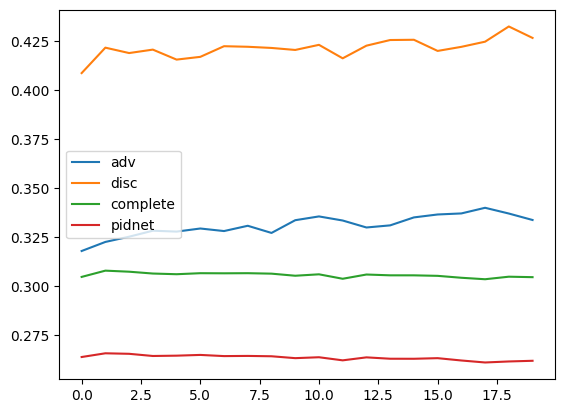

In [52]:
# PLOT LOSSES using plot_losses
import matplotlib.pyplot as plt
plt.plot(plot_losses['adv'], label='adv')
plt.plot(plot_losses['disc'], label='disc')
plt.plot(plot_losses['complete'], label='complete')
plt.plot(plot_losses['pidnet'], label='pidnet')
plt.legend()
plt.show()

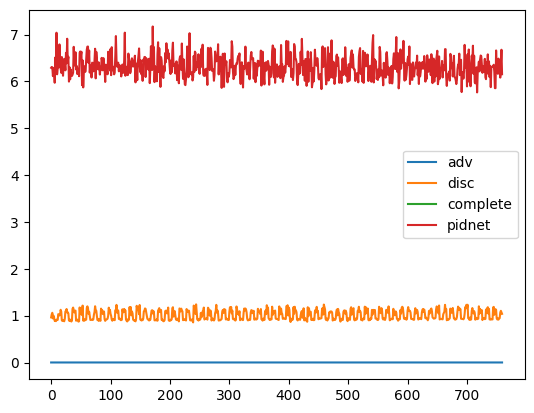

In [53]:
# PLOT BATCH LOSSES using batch_losses
import matplotlib.pyplot as plt
plt.plot(batch_losses['adv'], label='adv')
plt.plot(batch_losses['disc'], label='disc')
plt.plot(batch_losses['complete'], label='complete')
plt.plot(batch_losses['pidnet'], label='pidnet')
plt.legend()
plt.show()

# TEST

### Remove all models in local

In [54]:
# import os

# all_local_files = os.listdir('.')
# all_local_models = [f for f in all_local_files if f.endswith('.pth')]

# for model_name in all_local_models:
#     os.remove(model_name)
#     print(f"Removed {model_name}")

### Copy Some Models From MyDrive/LoveDA

In [55]:
# Run the first cell pls
import os

BASE_PATH = "/content/drive/MyDrive/LoveDA/"

if TEST_MODELS_FROM_MYDRIVE_TOO:
  all_mydrive = os.listdir(BASE_PATH)
  all_models = [f for f in all_mydrive if f.endswith('.pth')]
  models_of_interest = [f for f in all_models if INTEREST in f]
  for model_name in models_of_interest:
      if not os.path.exists(model_name):
        print(f"Copying {model_name} locally from MyDrive")
        # !cp {BASE_PATH+model_name} .

In [56]:
!pip install torchmetrics ptflops

In [ ]:
from torchmetrics import Accuracy
from tqdm import tqdm
import time
import ptflops
import os

DEVICE = 'cuda'
TYPE = 'Test'
# WARNING: YOU MAY DECIDE TO OVVERIDE THE CHOOSE_TRANSFORM, BUT BE CAREFUL. BE SURE THE MODEL YOU'RE USING IS THE CORRECT ONE
CHOOSE_TRANSFORM = 'Resize'

# Create unweighted models
model = BiSeNet(backbone='STDCNet1446', n_classes=len(LABEL_MAP), pretrain_model=pretrain_path,
    use_boundary_2=True, use_boundary_4=True, use_boundary_8=True,
    use_boundary_16=False, use_conv_last=False)
# disc_model = Discriminator(len(LABEL_MAP))

# Load weights
model_name_pattern = 'best_DA_STDC_model' # for starters, use 'best_DA_model' for this step, and just 'best_model' for non DA models
disc_model_name_pattern = 'best_disc_model'

# find filenames that start with model_name_pattern using os
model_files_paths = [f for f in os.listdir('.') if f.endswith('.pth')]
model_files_paths = [f for f in model_files_paths if f.startswith('best')]
# disc_model_files_paths = [f for f in os.listdir('.') if f.startswith(disc_model_name_pattern)]
print(model_files_paths)

for model_file_path in model_files_paths:
    best_model = torch.load(model_file_path, weights_only=True)
    # best_disc_model = torch.load(disc_model_file_path, weights_only=True)

    model.load_state_dict(best_model)
    model = model.to(DEVICE)
    # disc_model.load_state_dict(best_disc_model)
    # disc_model = disc_model.to(DEVICE)

    accuracy, mIoU = True, True

    TARGETs = ['Urban', 'Rural']

    for TARGET in TARGETs:
        if TARGET == 'Urban': # Here we just validate on less images if URBAN, as it's not the focus of step 3b. Use Train instead of Validation for a 0.8 split instead of 0.2
            target_type = 'Validation'
        elif TARGET == 'Rural': # While we take the entirety of the Rural folder in case of Rural
            #target_type = 'ActualTest'
            target_type = 'Validation'
        else:
            raise ValueError("TARGET must be 'Urban' or 'Rural'")



        if CHOOSE_TRANSFORM == 'RandomCropOrResize':
            test_augmentation = AUGMENTATIONS['RandomCrop512']
        elif CHOOSE_TRANSFORM == 'RandomCropXXX':
            test_augmentation = AUGMENTATIONS['None']
        elif CHOOSE_TRANSFORM == 'Jitter':
            test_augmentation = AUGMENTATIONS['None']
        elif CHOOSE_TRANSFORM == 'GaussianBlur':
            test_augmentation = AUGMENTATIONS['None']
        else:
            test_augmentation = AUGMENTATIONS[CHOOSE_TRANSFORM]

        test_dataset = LoveDADataset(baseTransform=test_augmentation, augTransforms=None, split=TARGET, type=target_type, useBoundaries=False)
        test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, drop_last=True, pin_memory=True)

        #### TEST LOOP
        model.eval()
        print(f"Testing model={model_file_path} on domain={TARGET} on a {target_type} split")

        # Latency
        with torch.no_grad():
            start_time = time.time()
            for _ in range(100):
                _ = model(torch.randn(1, 3, RESIZE, RESIZE).to(DEVICE))
            end_time = time.time()
        latency = (end_time - start_time) / 100
        print(f"Latency: {latency:.4f} seconds")

        # FLOPs
        macs, _ = ptflops.get_model_complexity_info(model,
            (3, RESIZE, RESIZE), as_strings=False,
            print_per_layer_stat=False, verbose=False)
        flops = macs * 2  # MACs perform two FLOPs
        print("FLOPs:", flops)

        # Number of parameters
        total_params = sum(p.numel() for p in model.parameters())
        print(f"Total number of parameters: {total_params}")

        if TYPE == 'Test':
            with torch.no_grad():
                total_union = torch.zeros(NUM_CLASSES).to(DEVICE)
                total_intersection = torch.zeros(NUM_CLASSES).to(DEVICE)
                meter = Accuracy(task='multiclass', num_classes=NUM_CLASSES).to(DEVICE)
                for (batch) in tqdm(test_loader):
                    ### Extract input
                    images, masks, img_path, bd_gts = batch
                    images = images.float().to(DEVICE)
                    masks = masks.to(DEVICE)

                    ### ===> Forward, Upscale, Compute Losses
                    ## Forward
                    outputs = model(images)

                    ## Upscale (bilinear interpolation - not learned)
                    h, w = masks.size(1), masks.size(2)
                    ph, pw = outputs[0].size(2), outputs[0].size(3)
                    if ph != h or pw != w:
                        for i in range(len(outputs)):
                            outputs[i] = F.interpolate(outputs[i], size=(h, w), mode='bilinear', align_corners=True)

                    # Output 1 is the prediction

                    # Shape: NBATCHES x classes x h x w
                    class_indices = torch.argmax(outputs[1], dim=1)  # Shape: NBATCHES x h x w

                    if accuracy:
                    # Create a mask for valid targets (where target is not -1)
                        valid_mask = (masks != -1)  # Mask of shape: NBATCHES x h x w
                        # Apply the mask to ignore -1 targets when updating the accuracy metric
                        meter.update(class_indices[valid_mask], masks[valid_mask])

                    if mIoU:
                        for predicted, target in zip(class_indices, masks):
                            for i in range(NUM_CLASSES):
                                total_intersection[i] += torch.sum(torch.logical_and(predicted == i, target == i))
                                total_union[i] += torch.sum(torch.logical_or(predicted == i, target == i))

        if accuracy:
            accuracy = meter.compute()
            print(f'\nAccuracy on the target domain: {100 * accuracy:.2f}%')

        if mIoU:
            intersection_over_union = total_intersection / total_union

            # Per class IoU
            for i, iou in enumerate(intersection_over_union):
                class_name = list(LABEL_MAP.keys())[list(LABEL_MAP.values()).index(i)]  # Get the class name from LABEL_MAP
                print(f'{class_name} IoU: {iou:.4f}')

            mIoU = torch.mean(intersection_over_union)
            print(f'\nmIoU on the {TARGET} domain: {mIoU}')

        print("========================================================================")

    if TEST_ONLY_ON_BEST:
        break


['best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=0_spid=0.pth_20.pth', 'best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5.pth_20.pth', 'best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth', 'best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=0_spid=0__bestmIoUUrban.pth']
Dataset size: 232
Testing model=best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=0_spid=0.pth_20.pth on domain=Urban on a Validation split
Latency: 0.0188 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 9/9 [00:07<00:00,  1.26it/s]



Accuracy on the target domain: 67.72%
Background IoU: 0.5316
Building IoU: 0.5216
Road IoU: 0.5284
Water IoU: 0.3841
Barren IoU: 0.4172
Forest IoU: 0.3399
Agricultural IoU: 0.1282

mIoU on the Urban domain: 0.4072725176811218
Dataset size: 274
Testing model=best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=0_spid=0.pth_20.pth on domain=Rural on a Validation split
Latency: 0.0188 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 11/11 [00:08<00:00,  1.30it/s]



Accuracy on the target domain: 43.84%
Background IoU: 0.3086
Building IoU: 0.2131
Road IoU: 0.1820
Water IoU: 0.3439
Barren IoU: 0.0572
Forest IoU: 0.4069
Agricultural IoU: 0.1572

mIoU on the Rural domain: 0.2383996844291687
Dataset size: 232
Testing model=best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5.pth_20.pth on domain=Urban on a Validation split
Latency: 0.0191 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 9/9 [00:07<00:00,  1.25it/s]



Accuracy on the target domain: 57.00%
Background IoU: 0.4637
Building IoU: 0.3605
Road IoU: 0.2637
Water IoU: 0.3460
Barren IoU: 0.2989
Forest IoU: 0.1256
Agricultural IoU: 0.0072

mIoU on the Urban domain: 0.2665202021598816
Dataset size: 274
Testing model=best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5.pth_20.pth on domain=Rural on a Validation split
Latency: 0.0191 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


100%|██████████| 11/11 [00:08<00:00,  1.26it/s]



Accuracy on the target domain: 37.38%
Background IoU: 0.2448
Building IoU: 0.2759
Road IoU: 0.0349
Water IoU: 0.2982
Barren IoU: 0.0271
Forest IoU: 0.4459
Agricultural IoU: 0.0292

mIoU on the Rural domain: 0.1937059760093689
Dataset size: 232
Testing model=best_DA_STDC_model_LA=0.0001_LD=0.1_LRdisc=0.0005_s=5_spid=5__bestmIoUUrban.pth on domain=Urban on a Validation split
Latency: 0.0195 seconds
FLOPs: 44402280704
Total number of parameters: 16074784


  0%|          | 0/9 [00:00<?, ?it/s]